In [1]:
#import numpy as np
import numpy.random as npr

import jax
import jax.numpy as np # TODO: change to jnp
import jax.random as jrnd
import jax.scipy.stats as jsps
import jax.scipy.linalg as spla
from jax.config import config
config.update("jax_enable_x64", True)
from jax.scipy.stats import gaussian_kde

import tqdm
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [2]:
from elliptical_slice_sampler_jax import elliptical_slice_jax

# Active phase mapping code


We want to write a function that takes as input a set of designs and returns the next candidate design, where each design represents a point in the $k-1$-dimensional simplex.
So: a the list of designs will have shape $N \times (k-1)$, where $k > 2$.

We want to make it easy to switch out the kernel and to do hyperparameter optimization if needed.

Questions:
* can we make our current jax things more efficient?
* [done] update such that it works w.r.t. a list of designs instead of knot_x
    * TODO: fix delete design part
* [done] start by cleaning up existing code and make sure it's working
* then try to get working in 2D:
    * how to compute the convex hull in higher dimensions (with jax)?
    * generate data
    * visualize hull on a triangle
* general kernels + hyperparameters
    * make it s.t. we can pass in a general kernel and an optimize parameters function
    * then test everything is still the same w/ the identity for optimize_parameters and squared exponential
    * then try using GP jax to optimize hyperparameters; compare it to the implementation from the normal jax people

Next steps (as of 2/10/23):
* Switch out the model to use an arbitary kernel (use a package that makes it easy to optimize kernel hyperparameters later on)
* Implement on fake data from a 3-configuration setting 
* Implement visualization for 3-configuration setting (triangles?)
* Implement baseline for >1 dimensional examples
* Swap out the convex hull code (is it slow?)

In [ ]:
### OLD CODE GET RID OF THIS 
def estimate_entropy_cond_s(samps, putative_x, data, s, rng_key, J=50):
    """
    samps: samples of f's from ellipitical slice sampling
    s: binary vector of tights
    """
    totsamps = len(samps); test_samps = samps[totsamps-J:totsamps]
    
    # get 1d predictive y samples
    #make_pred_single_wrap = lambda arg: make_pred_single(knot_x, arg, putative_x) ## TODO knot_x is global var here
    makepred_vmap = jax.jit(jax.vmap(make_pred_single_wrap, in_axes=(0,)))
    
    #mus, sigmas = makepred_vmap(test_samps)
    
    vals = np.array([make_pred_single_wrap(ts) for ts in test_samps])
    mus = vals[:,0]; sigmas = vals[:,1]
    #ystars = jrnd.multivariate_normal(rng_key, mus, np.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    ystars = npr.multivariate_normal(mus, np.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    
    # compute a KDE estimator of density p(y | s, data, putative_x)
    ypred_kde = jsps.gaussian_kde(ystars, bw_method='scott', weights=None)
    
    # evaluate the log probability on the samples y^{(j)}
    return -ypred_kde.logpdf(ystars).mean() # inner MC estimate


def make_preds_old(train_x, train_y, test_x):
    """
    Given data, get pred_mean and pred_cov. 
    """
    train_K = kernel(train_x, train_x, ls) + 1e-6*np.eye(train_x.shape[0])
    cross_K = kernel(train_x, test_x, ls)
    kappa_K = kernel( test_x, test_x, ls)

    # Predictive parameters.
    train_cK = spla.cholesky(train_K)
    cross_solve = spla.cho_solve((train_cK,  False), cross_K)
    pred_mean = train_y.T @ cross_solve
    pred_cov  = kappa_K - cross_K.T @ cross_solve  + 1e-6*np.eye(1)
    
    return pred_mean, pred_cov

## TODO: need to learn kernel hyperparameters
def kernel_old(x1, x2, ls):
    """
    Squared expoential kernel with lengthscale ls. 
    """
    x1 = np.atleast_2d(x1)
    x2 = np.atleast_2d(x2)
    return np.exp(-0.5*(x1.T-x2)**2/ls**2)

In [560]:
def kernel_rbf(x1, x2):
    """
    Squared expoential kernel with lengthscale ls. 
    """
    ls=0.1; v=1
    #ls = params["lengthscale"]; v = params["variance"]
    return v * np.exp(-0.5 * np.linalg.norm(x1-x2) ** 2 / ls ** 2)

def K(kernel, xs, ys):
    """
    Compute a Gram matrix or vector from a kernel and an array of data points.
    Args:
    kernel: callable, maps pairs of data points to scalars.
    xs: array of data points, stacked along the leading dimension.
    Returns: A 2d array `a` such that `a[i, j] = kernel(xs[i], xs[j])`.
    """
    return jax.vmap(lambda x: jax.vmap(lambda y: kernel(x, y))(ys))(xs)


def make_preds(train_x, train_y, test_x):
    """
    Given data, get pred_mean and pred_cov. 
    
    TODO: change argument to data instead of train_x, train_y?
    """
    train_K = K(kernel_rbf, train_x, train_x) + 1e-6*np.eye(train_x.shape[0])
    cross_K = K(kernel_rbf, train_x, test_x)
    kappa_K = K(kernel_rbf, test_x, test_x)

    # Predictive parameters.
    train_cK = spla.cholesky(train_K)
    cross_solve = spla.cho_solve((train_cK,  False), cross_K)
    pred_mean = train_y.T @ cross_solve
    pred_cov  = kappa_K - cross_K.T @ cross_solve + 1e-6*np.eye(test_x.shape[0])
    
    return pred_mean, pred_cov

def convelope(design_space, knot_y):

    N, D = design_space.shape
    deriv_marg_var = 100
    d_kernel = jax.jit(jax.vmap(jax.grad(jax.grad(lambda x1, x2, ls: kernel_old(x1, x2, ls)[0,0], argnums=0), argnums=1), in_axes=(0,0,None)))
    # TODO: 
    #deriv_marg_var = np.max(np.diag(d_kernel(knot_x, knot_x, ls)))
    #print(deriv_marg_var)
    s = np.linspace(-3*np.sqrt(deriv_marg_var), 3*np.sqrt(deriv_marg_var), 500)
    ss = np.meshgrid(*[s.ravel()]*D)
    s = np.array([sx.flatten() for sx in ss]).T

    knot_y = np.atleast_2d(knot_y) # samples x num_primal
    print(knot_y.shape)
    
    prod = (design_space @ s.T).T
    print(prod.shape)
    
    # compute the conjugate
    lft1 = np.max(prod[np.newaxis,:,:] - knot_y[:,np.newaxis,:],  axis=2) # samples x num_dual
    print(lft1.shape)
    # compute the biconjugate
    lft2 = np.max(prod[np.newaxis,:,:] - lft1[:,:,np.newaxis],  axis=1) # samples x num_primal
    
    return lft2

# Compute the convex envelope given x and y values
def convelope_old(knot_x, knot_y):
    #d_kernel = jax.jit(jax.vmap(jax.grad(jax.grad(lambda x1, x2, ls: kernel_old(x1, x2, ls)[0,0], argnums=0), argnums=1), in_axes=(0,0,None)))
    # TODO: 
    #deriv_marg_var = np.max(np.diag(d_kernel(knot_x, knot_x, ls)))
    deriv_marg_var = 100
    s = np.linspace(-3*np.sqrt(deriv_marg_var), 3*np.sqrt(deriv_marg_var), 500)

    knot_y = np.atleast_2d(knot_y) # samples x num_primal
    print(knot_y.shape)
    sx = s[:,np.newaxis] * knot_x[np.newaxis,:] # num_dual x num_primal
    print(sx.shape)
    # compute the conjugate
    lft1 = np.max(sx[np.newaxis,:,:] - knot_y[:,np.newaxis,:],  axis=2) # samples x num_dual
    print(lft1.shape)
    # compute the biconjugate
    lft2 = np.max(sx[np.newaxis,:,:] - lft1[:,:,np.newaxis],  axis=1) # samples x num_primal
    return lft2


def generate_true_function(design_space, knot_N): # todo: pass kernel as argument
    # TODO: make it such that we can pass in a dimension too? or just stick to 1d vs 2d. 
    #knot_x = np.linspace(0, 1, knot_N)
    knot_K = K(kernel_rbf, design_space, design_space) + 1e-8 * np.eye(knot_N)
    # Cholesky decomposition of the kernel matrix
    knot_cK = spla.cholesky(knot_K)
    # Form the true function of interest at knot_N number of points
    true_y = knot_cK.T @ npr.randn(knot_N)
    # compute envelope based on true function
    true_envelope = convelope(design_space, true_y)
    
    return true_y, true_envelope

In [562]:

true_y, true_envelope = generate_true_function(design_space, knot_N)

(1, 40)
(500, 40)
(1, 500)


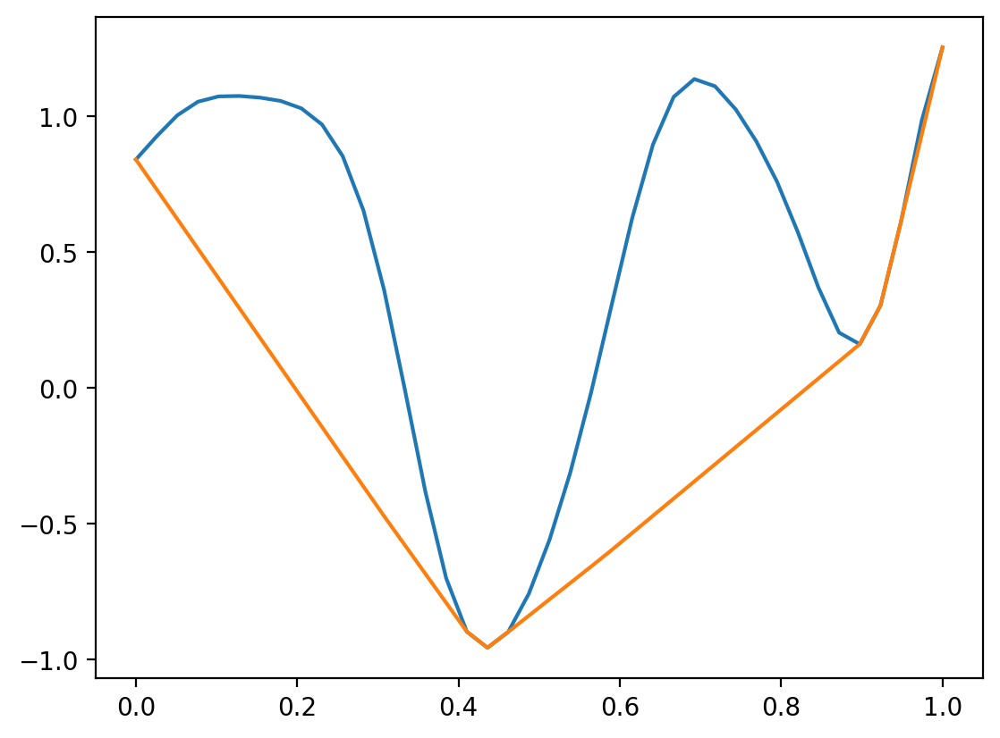

In [564]:
plt.plot(design_space, true_y)
plt.plot(design_space, true_envelope.T)

In [556]:
true_y

Array([-1.41457866, -1.48447293, -1.408885  , -1.18472954, -0.84166901,
       -0.4506866 , -0.11346302,  0.08195943,  0.1093279 ,  0.02040176,
       -0.08720152, -0.13153882, -0.08983688, -0.0016377 ,  0.06398896,
        0.04405244, -0.08753594, -0.30633932, -0.53797992, -0.68022658,
       -0.64673476, -0.41576814, -0.04918999,  0.33515305,  0.62572407,
        0.77021158,  0.78095752,  0.70318288,  0.57724407,  0.42712157,
        0.27077983,  0.1298597 ,  0.02285119, -0.05323197, -0.12857603,
       -0.24611858, -0.43048347, -0.6661983 , -0.89863197, -1.06450342],      dtype=float64)

In [525]:
N, D = design_space.shape
deriv_marg_var = 100
d_kernel = jax.jit(jax.vmap(jax.grad(jax.grad(lambda x1, x2, ls: kernel_old(x1, x2, ls)[0,0], argnums=0), argnums=1), in_axes=(0,0,None)))
# TODO: 
#deriv_marg_var = np.max(np.diag(d_kernel(knot_x, knot_x, ls)))
#print(deriv_marg_var)
s = np.linspace(-3*np.sqrt(deriv_marg_var), 3*np.sqrt(deriv_marg_var), 500)
ss = np.meshgrid(*[s.ravel()]*D)
s = np.array([sx.flatten() for sx in ss]).T

prod = (design_space @ s.T).T # num_dual x num_primal
knot_y = np.atleast_2d(pred_Y.T) # samples x num_primal
# compute the conjugate
lft1 = np.max(prod[np.newaxis,:,:] - knot_y[:,np.newaxis,:],  axis=2) # samples x num_dual
# compute the biconjugate
lft2 = np.max(prod[np.newaxis,:,:] - lft1[:,:,np.newaxis],  axis=1) # samples x num_primal

99.99999999999999
(1, 40)
(500, 40)
(1, 500)
(1, 40)
(500, 40)
(1, 500)


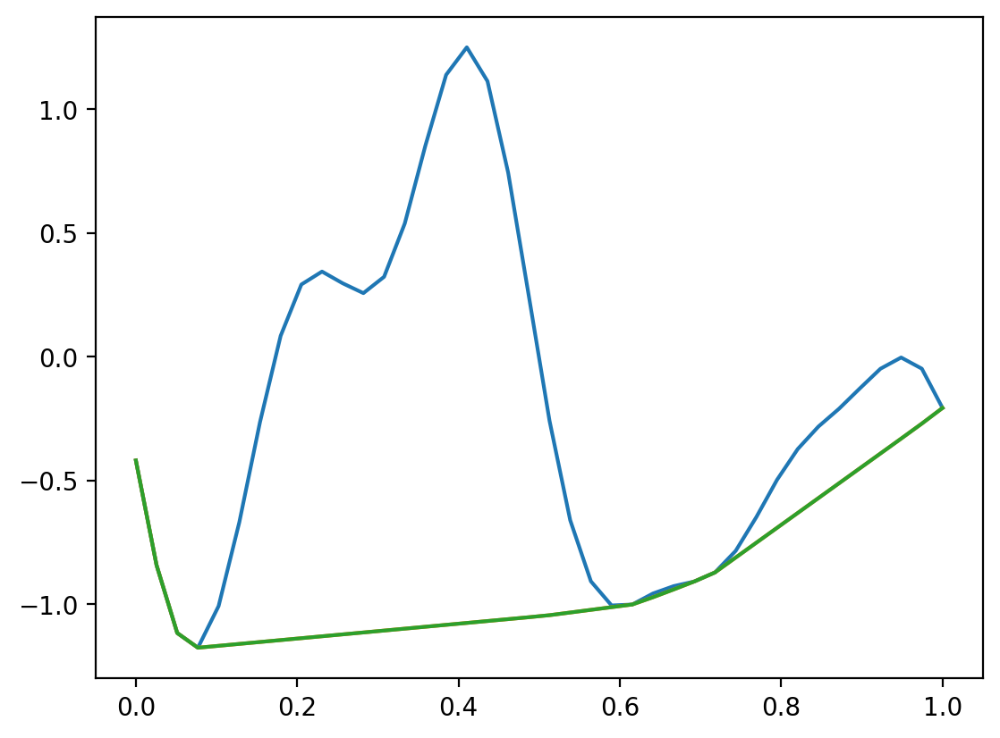

In [547]:
ind = 24

plt.plot(knot_x, pred_Y.T[ind,:])
plt.plot(knot_x[:,np.newaxis], convelope(knot_x[:,np.newaxis], pred_Y.T[ind,:]).T)
plt.plot(knot_x[:,np.newaxis], convelope_old(knot_x, pred_Y.T[ind,:]).T)

In [ ]:
# the only difference seems to be how we construct sx and then we don't need to add the new axis later on?

In [296]:
nx, ny = (2, 2)
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
xv, yv = np.meshgrid(x, y)
train_x = np.array([xv.flatten(),yv.flatten()]).T

In [297]:
train_x

Array([[0., 0.],
       [1., 0.],
       [0., 1.],
       [1., 1.]], dtype=float64)

In [304]:
dd = knot_x[:,np.newaxis]

N, D = dd.shape
deriv_marg_var = 1
s = np.linspace(-3*np.sqrt(deriv_marg_var), 3*np.sqrt(deriv_marg_var), 500)[:, np.newaxis]

In [457]:

design_space = knot_x[:,np.newaxis]

N, D = design_space.shape
print(N, D)
s = np.linspace(-3*np.sqrt(deriv_marg_var), 3*np.sqrt(deriv_marg_var), 500)
#D = 1


ss = np.meshgrid(*[s.ravel()]*D)
s = np.array([sx.flatten() for sx in ss]).T

prod = design_space @ s.T
knot_y = np.atleast_2d(true_y) # samples x num_primal
# compute the conjugate
lft1 = np.max(prod.T[np.newaxis,:,np.newaxis,:] - knot_y[:,np.newaxis,:],  axis=2) # samples x num_dual
# compute the biconjugate
lft2 = np.max(prod.T[np.newaxis,:,np.newaxis,:] - lft1[:,:,np.newaxis],  axis=1) # samples x num_primal

40 1


In [3]:
def elliptical_slice_jax(x0, log_lh_func, chol, num_samples, rng_key):
    """
    Jax implementation of ESS
    """

    @jax.jit
    def ess_step_condfun(state):
        x, new_x, nu, thresh, lower, upper, rng_key = state
        llh = log_lh_func(new_x)
        return log_lh_func(new_x) < thresh

    @jax.jit
    def ess_step_bodyfun(state):
        x, new_x, nu, thresh, lower, upper, rng_key = state
        theta_rng, rng_key = jrnd.split(rng_key, 2)
        theta = jrnd.uniform(theta_rng, minval=lower, maxval=upper)
        new_x = x * np.cos(theta) + nu * np.sin(theta)
        lower, upper = jax.lax.cond(theta < 0, lambda : (theta, upper), lambda : (lower, theta))
        return x, new_x, nu, thresh, lower, upper, rng_key

    @jax.jit
    def ess_step(x, rng_key):
        nu_rng, u_rng, theta_rng, rng_key = jrnd.split(rng_key, 4)
        nu = chol.T @ jrnd.normal(nu_rng, shape=x.shape)
        u = jrnd.uniform(u_rng)
        thresh = log_lh_func(x) + np.log(u)
        theta = jrnd.uniform(theta_rng, minval=0, maxval=2* np.pi)
        upper = theta
        lower = theta - 2* np.pi
        new_x = x * np.cos(theta) + nu * np.sin(theta)
        _, new_x, _, _, _, _, _ = jax.lax.while_loop(
          ess_step_condfun,
          ess_step_bodyfun,
          (x, new_x, nu, thresh, lower, upper, rng_key)
        )
        return new_x

    @jax.jit
    def scanfunc(state, xs):
        x, rng_key = state
        step_key, rng_key = jrnd.split(rng_key, 2)
        x = ess_step(x, step_key)
        return (x, rng_key), x

    _, samples = jax.lax.scan(scanfunc, (x0, rng_key), None, num_samples)

    return samples

In [80]:
def ess_and_estimate_entropy(putative_x, design_space, data, s, y, cK, rng_key, J=50):
    """
    Get samples of function conditioned on tights, get samples of y preds conditioned on 
        these samples, and then estimate the entropy.
    """
    ## TODO: get rid of knot_cK?
    # sample J*3 number of points but only keep the last J 
    def same_tight(y, tight):
        new_hull = convelope(knot_x, y).ravel()
        new_tight = y - new_hull < 1e-3
        return np.all(tight == new_tight)

    # samples of f given tights
    samps = elliptical_slice_jax(y.ravel(), lambda x: np.log(same_tight(x, s)), cK, J*3, rng_key)
    
    
    totsamps = J*3; test_samps = samps[totsamps-J:totsamps]
    
    # get 1d predictive y samples at values of design space
    def make_pred_single(train_y):
        pred_mean, pred_cov = make_preds(design_space, train_y, putative_x)
        return pred_mean.ravel()[0], pred_cov.ravel()[0]
    
    #make_pred_single_wrap = lambda yarg: make_pred_single(design_space, yarg, putative_x) ## TODO knot_x is global var here
    makepred_vmap = jax.jit(jax.vmap(make_pred_single, in_axes=(0,)))
    
    mus, sigmas = makepred_vmap(test_samps)
    
    #vals = np.array([make_pred_single_wrap(ts) for ts in test_samps])
    #mus = vals[:,0]; sigmas = vals[:,1]
    ystars = jrnd.multivariate_normal(rng_key, mus, np.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    #ystars = npr.multivariate_normal(mus, np.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    
    # compute a KDE estimator of density p(y | s, data, putative_x)
    ypred_kde = jsps.gaussian_kde(ystars, bw_method='scott', weights=None)
    
    # evaluate the log probability on the samples y^{(j)}
    return -ypred_kde.logpdf(ystars).mean() # inner MC estimate
    #return estimate_entropy_cond_s(samps_f, putative_x, s, rng_key, J)

In [104]:
T=20; tol=1e-3
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, T, design_space) ## eventually need to tell it about the original design space, for now assume designs = design space
# compute the vector of indicators
tights = np.abs(envelopes.T - pred_Y) < tol ## NOTE: we transposed the shape from what it was before

def same_tight(y, tight):
    new_hull = convelope(knot_x, y).ravel()
    new_tight = y - new_hull < 1e-3
    return np.all(tight == new_tight)
    
samps = elliptical_slice_jax(pred_Y[:,1].ravel(), lambda x: np.log(same_tight(x, envelopes[1])), pred_cK, 10*3, rng_key)

In [121]:
J=10 
totsamps = len(samps)
test_samps = samps[totsamps-J:totsamps]
make_pred_single_wrap = lambda arg: make_pred_single(design_space, arg, design_space[1]) ## TODO knot_x is global var here
makepred_vmap = jax.jit(jax.vmap(make_pred_single_wrap, in_axes=(0,)))
mus, sigmas = makepred_vmap(test_samps)

In [88]:
vals = np.array([make_pred_single_wrap(ts) for ts in test_samps])
mus = vals[:,0]; sigmas = vals[:,1]
ystars = npr.multivariate_normal(mus, np.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean

In [122]:
mus, sigmas = makepred_vmap(test_samps)

In [123]:
ystars = jrnd.multivariate_normal(rng_key, mus, np.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean

In [124]:
ystars

Array([ 0.19085836,  0.08144443,  0.06685054,  0.12464326, -0.02002594,
       -0.00513655, -0.31585879, -0.4891158 , -0.49369741, -0.05758667],      dtype=float64)

In [441]:
def compute_IG_putative_x(putative_x, design_space, data, pred_cK, pred_Y, tights, rng_key, T=100, J=200):
    """
    Compute a Monte Carlo approximation of the IG w.r.t. T samples of s_t ~ p(s | data).
    
    The inner entropy is approximated via Monte Carlo + a KDE estimator constructed from the samples. 
    (TODO: don't use the same data twice)
    
    T: number of samples for the outer expectation
    J: number of ESS samples (controls the # of samples for the inner MC too?)
    """

    def entropy_est_wrap(args):
        tights_i, pred_Y_i = args
        ### TODO: is this the correct quantity to slice sample from?
        return ess_and_estimate_entropy(putative_x, design_space, data, tights_i, pred_Y_i, pred_cK, rng_key, J=J)
    ventropy_est = jax.jit(jax.vmap(entropy_est_wrap, in_axes=((1,1),)))
    
    entropies = ventropy_est((tights, pred_Y))  
    
    #entropies = np.array([ess_and_estimate_entropy(putative_x, design_space, data, tights[:,i], pred_Y[:,i], pred_cK, rng_key, J=J) for i in range(len(tights))])
    
    # estimate of the second term in the EIG
    return entropies.mean()
    

def get_next_candidate(data, design_inds, design_space, rng_key, T=30, J=40, tol=1e-3):
    """
    Given current data and a list of designs, computes an IG score for each design. 
    
    T: number of outer MC samples
    J: number of inner MC samples
    tol: tolerance for considering what is tight w.r.t. the convex hull
    
    Returns the best design and the list of scores. 
    """

    print(len(design_inds))
    
    # updates the model and samples T functions and computes their envelopes. here we evaluate functions only at points in the design space
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, T, design_space) 
    # compute the vector of indicators
    tights = np.abs(envelopes.T - pred_Y) < tol ## NOTE: we transposed the shape from what it was before
    
    # TODO: move the lambda function into the vmap to make it cleaner
    compute_IG_putative_wrap = lambda x: compute_IG_putative_x(x, design_space, data, pred_cK, pred_Y, tights, rng_key, T = T, J = J) 
    compute_IG_vmap = jax.jit(jax.vmap(compute_IG_putative_wrap, in_axes=0))
    
    curr_entropy = np.log(np.sqrt(2*np.pi*np.e*np.diag(pred_cov[np.ix_(design_inds, design_inds)]))) # TOD0: need to index the relevant designs
    mean_entropy = compute_IG_vmap(design_space[design_inds,:])
    
    entropy_change = curr_entropy - mean_entropy
    return entropy_change.argmax(), entropy_change

def get_next_candidate_baseline(data, designs):
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, 20)
    
    train_x, train_y = data
    
    # TODO: update for non-1d example
    covariances = np.array([make_pred_single(train_x, train_y, x)[1] for x in designs])
    entropy_change = 0.5 * np.log(covariances + 1)
    return entropy_change.argmax(), entropy_change


def update_model(data, T, design_space):
    N_designs = design_space.shape[0]
    train_x, train_y = data
    
    # update model hyperparameters
    params = 1
    
    
    # sample functions ~ posterior
    pred_mean, pred_cov = make_preds(train_x, train_y, design_space) ### ? 
    pred_cK = spla.cholesky(pred_cov)
    # get T samples from the posterior
    pred_Y = pred_cK.T @ npr.randn(N_designs, T) + pred_mean[:,np.newaxis] ## global variable
    # get s by computing the vector of tights w.r.t. posterior samples
    envelopes = convelope_old(knot_x, pred_Y.T) ## global variable
    
    return pred_mean, pred_cov, pred_cK, pred_Y, envelopes


def plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, scores, plot_eig=True, legend=True, plot_hulls=True):
    train_x, train_y = data
    
    plt.figure(figsize=(10,4))

    # Plot true function, convex hull, and GP model mean + uncertainty
    plt.plot(knot_x, true_y, "k", lw=2, label="True function")
    plt.plot(knot_x, true_envelope.T, ls="dashed", label="True envelope", lw=2, c="k")
    plt.plot(knot_x, pred_mean, lw=2, c="tab:blue", label="Model")
    y_err = np.sqrt(np.diag(pred_cov))
    plt.fill_between(knot_x, pred_mean - y_err, pred_mean + y_err, alpha=0.4, color="tab:blue")
    
    if plot_hulls:
        # Plot convex hulls of posterior samples
        plt.plot(knot_x, envelopes[:15,:].T, lw=0.5, c="gray")

    # Plot data / next evaluation
    plt.scatter(knot_x[next_x], true_y[next_x], marker="*", color="tab:red", zorder=5, sizes=[150], label="Next evaluation")
    plt.scatter(train_x, train_y, label="Observed data", c="k", zorder=5)

    # Plot the entropy estimates (i.e., -second term of EIG)
    if plot_eig:
        plt.scatter(knot_x, scores, c="purple", marker="|", label="EIG")
        
    if legend:
        plt.legend(ncol=2)

    plt.ylim(-3,3); plt.xlabel("Composition space"); plt.ylabel("Energy")
    
def add_observation(data, true_y, next_x):
    train_x, train_y = data
    train_x = np.concatenate([train_x, np.array([knot_x[next_x]])])
    train_y = np.concatenate([train_y, np.array([true_y[next_x]])])
    return (train_x, train_y)

def compute_distances(data, true_envelopes):
    distances = []
    for (i,x) in enumerate(data[0]):
        x_idx = (knot_x == x).argmax()
        distances.append(np.abs(data[1][i] - true_envelope[1][x_idx]))
    return np.array(distances)

In [234]:
rng_key = jrnd.PRNGKey(2)

# updates the model and samples T functions and computes their envelopes.
T=20; tol=1e-3
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, T, design_space) ## eventually need to tell it about the original design space, for now assume designs = design space
# compute the vector of indicators
tights = np.abs(envelopes.T - pred_Y) < tol ## NOTE: we transposed the shape from what it was before


# TODO: move the lambda function into the vmap to make it cleaner
compute_IG_putative_wrap = lambda x: compute_IG_putative_x(x, design_space, data, pred_cK, pred_Y, tights, rng_key, T = T, J = J) 
compute_IG_vmap = jax.jit(jax.vmap(compute_IG_putative_wrap, in_axes=0))

#mean_entropy = compute_IG_vmap(design_space)

compute_IG_putative_wrap(design_space[0])

TypeError: sub got incompatible shapes for broadcasting: (1, 500, 55), (20, 1, 40).

In [161]:
compute_IG_vmap(design_space)

Array([-4.70345361, -0.13404037,  0.51435437,  0.78845844,  0.89192958,
        0.93547539,  0.99084691,  1.04629416,  1.05836539,  1.12256916,
        1.29959606,  1.47656449,  1.58095006,  1.55819797,  1.37091513,
        1.00604895,  0.68464122,  0.57066427,  0.7076081 ,  1.01475533,
        1.35759907,  1.55856427,  1.65940628,  1.69559247,  1.68048657,
        1.61306028,  1.50496944,  1.36788916,  1.17101456,  0.89299304,
        0.52490167,  0.21573282,  0.39432069,  0.75479604,  0.99669136,
        1.04874536,  0.91389961,  0.55738314, -0.17000303, -4.45748918],      dtype=float64)

In [444]:
# Number of points to discretize the space into
knot_N = 40

# Set random seed
npr.seed(2); rng_key = jrnd.PRNGKey(2)
# Length scale for the kernel
ls = 0.1
true_y, true_envelope = generate_true_function(knot_N)



# grid to discretize design space into
knot_x = np.linspace(0, 1, knot_N)
design_space = knot_x[:, np.newaxis]

# Let's imagine that we start out by observing the two end points.
train_x = np.array([design_space[0], design_space[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
# Predict functions over the entire design space
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, 30, design_space)

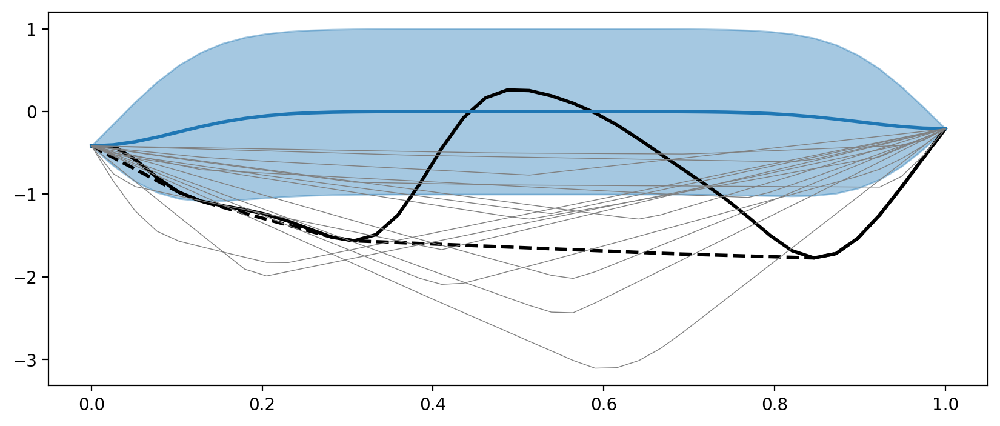

In [7]:
plt.figure(figsize=(10,4))

# Plot true function, convex hull, and GP model mean + uncertainty
plt.plot(knot_x, true_y, "k", lw=2, label="True function")
plt.plot(knot_x, true_envelope.T, ls="dashed", label="True envelope", lw=2, c="k")
plt.plot(knot_x, pred_mean, lw=2, c="tab:blue", label="Model")
y_err = np.sqrt(np.diag(pred_cov))
plt.fill_between(knot_x, pred_mean - y_err, pred_mean + y_err, alpha=0.4, color="tab:blue")

# Plot convex hulls of posterior samples
plt.plot(knot_x, envelopes[:15,:].T, lw=0.5, c="gray");

In [51]:
design_inds = np.array(range(1, knot_N-1))


In [54]:
#get_next_candidate(data, designs, rng_key, T=30, J=40, tol=1e-3)

next_x, entropy_change = get_next_candidate(data, design_inds, design_space, rng_key)

In [63]:
entropy_change.argmax()

Array(32, dtype=int64)

In [60]:
np.delete(design_inds, next_x)

Array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35,
       36, 37, 38], dtype=int64)

In [92]:
test_inds = np.array(range(10))+0.1

In [93]:
test_inds

Array([0.1, 1.1, 2.1, 3.1, 4.1, 5.1, 6.1, 7.1, 8.1, 9.1],      dtype=float64, weak_type=True)

In [94]:
np.delete(test_inds, 7)

Array([0.1, 1.1, 2.1, 3.1, 4.1, 5.1, 6.1, 8.1, 9.1],      dtype=float64, weak_type=True)

In [90]:
test_inds

Array([0.1, 1.1, 2.1, 3.1, 4.1, 5.1, 6.1, 7.1, 8.1, 9.1],      dtype=float64, weak_type=True)

Iteration:  0
40
CPU times: user 22.6 s, sys: 356 ms, total: 23 s
Wall time: 20.5 s
[-1.39252904  1.5356039   1.57915427  1.60806923  1.59354027  1.59483206
  1.62324906  1.66742411  1.66507393  1.607285    1.50627622  1.43909905
  1.41023243  1.43276387  1.47508177  1.50033487  1.48670027  1.44530038
  1.40218123  1.37960327  1.37171045  1.34123164  1.27904873  1.21580582
  1.17437056  1.15914299  1.16796485  1.19192964  1.21868947  1.2701816
  1.32843211  1.3969783   1.46592511  1.50087726  1.49883209  1.47122212
  1.42459899  1.39610704  1.39437856 -0.99108253]
Iteration:  1
40
CPU times: user 21.9 s, sys: 280 ms, total: 22.2 s
Wall time: 19.4 s
[-1.62991567  2.01192329  2.10211069  2.16343522  2.19136471  2.1687527
  1.94176211 -2.50650543  1.91323399  2.08750664  2.04292214  1.96743325
  1.90081783  1.83725921  1.79999323  1.75565005  1.71242093  1.68449104
  1.65117756  1.6087473   1.58388547  1.57316138  1.57503565  1.58140367
  1.59868085  1.63418412  1.63631885  1.62603522  1.

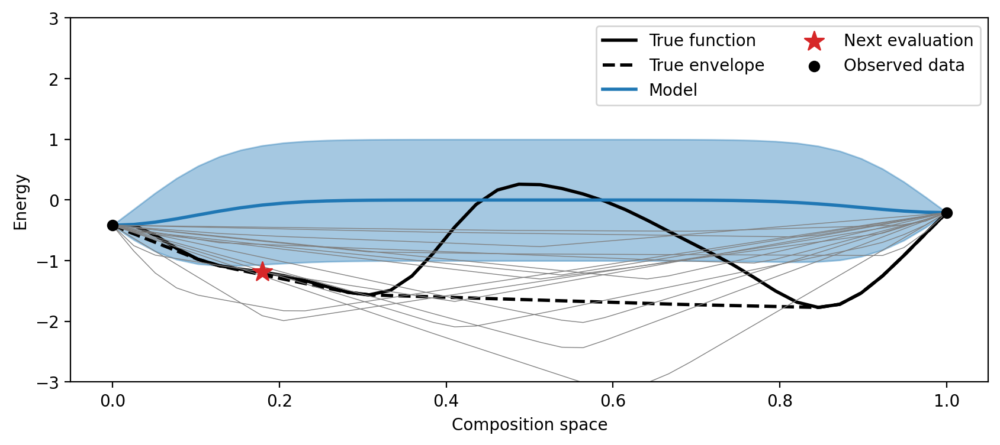

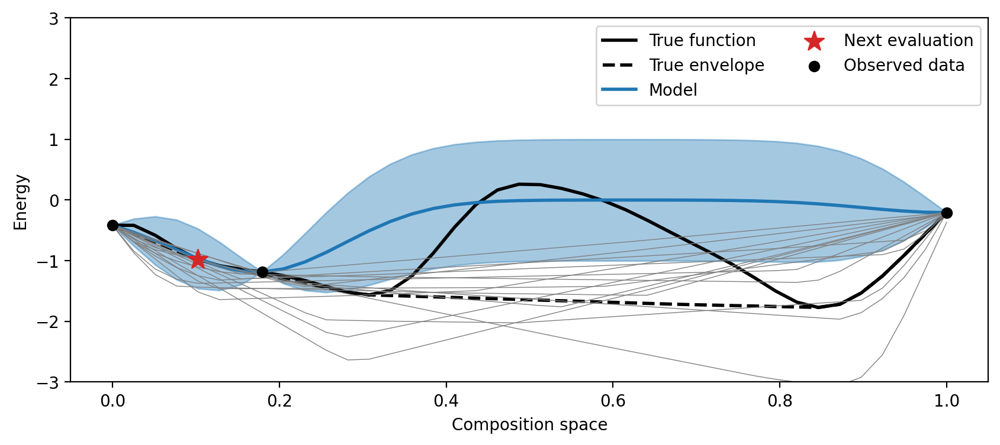

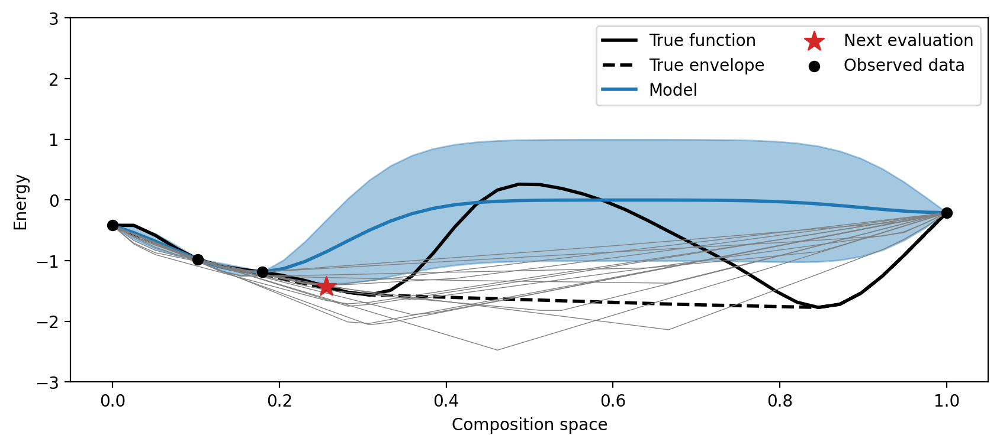

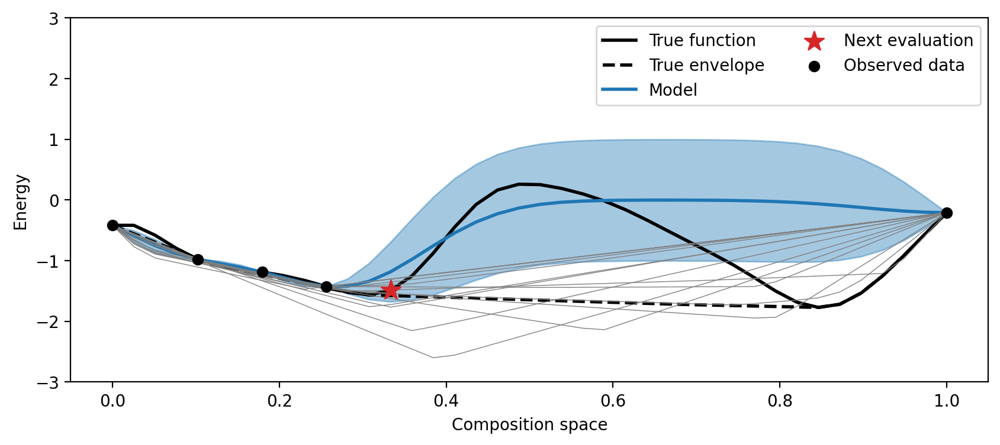

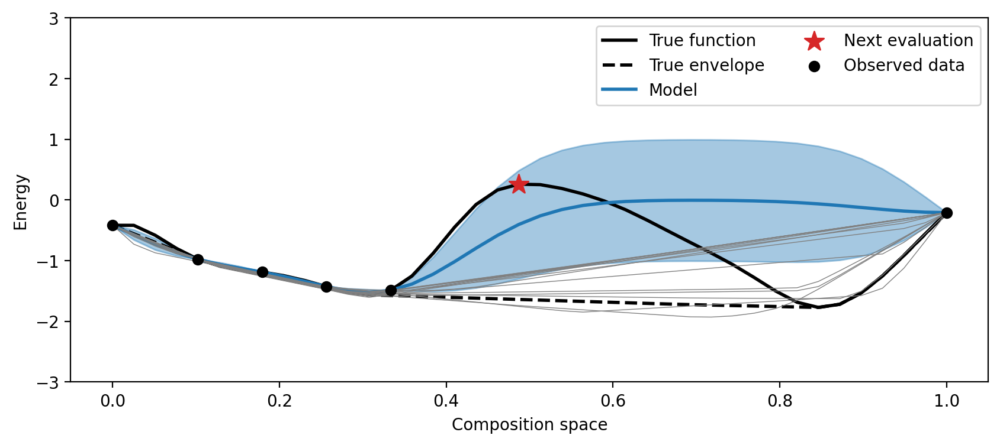

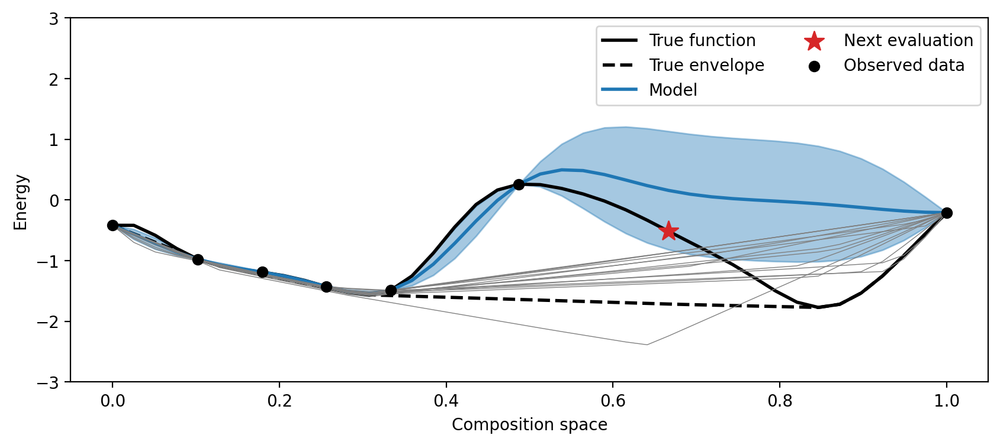

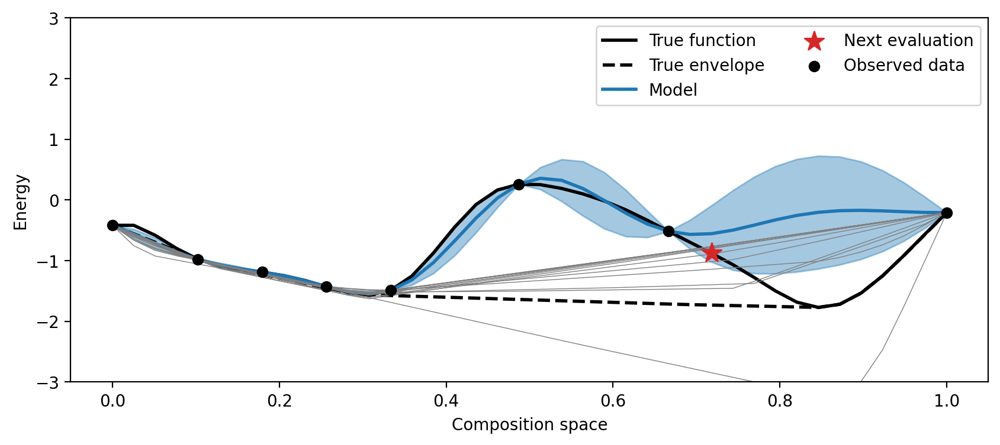

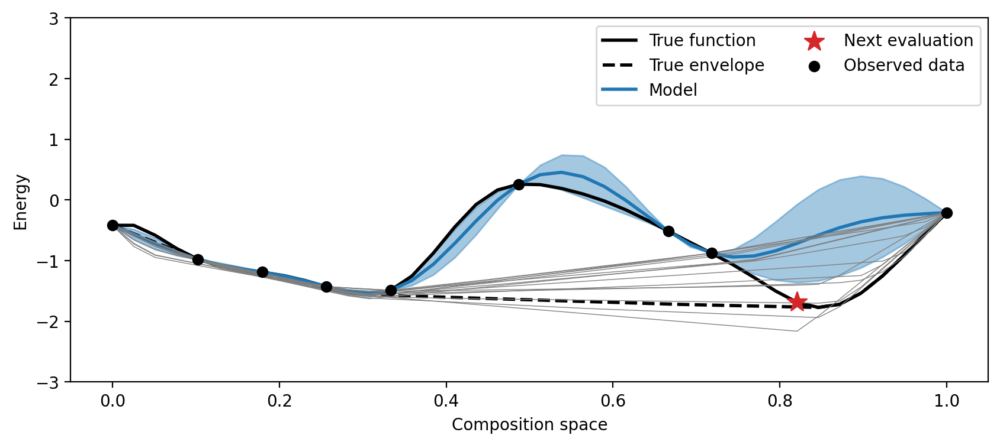

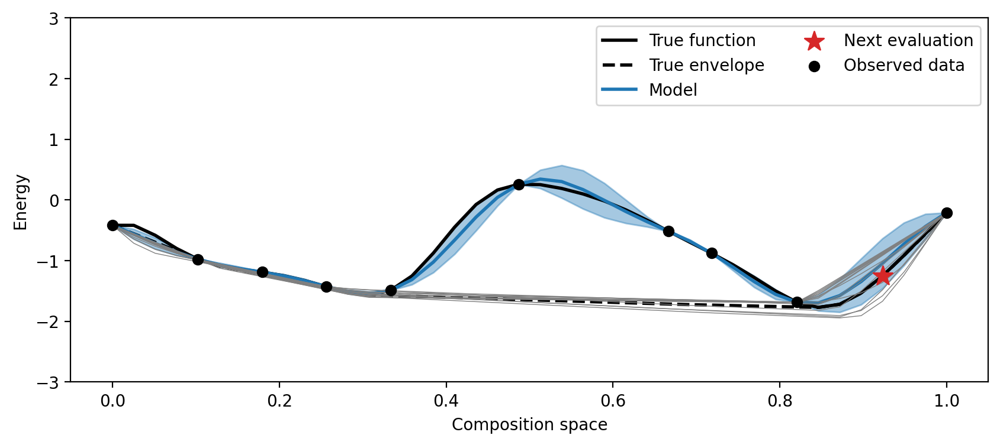

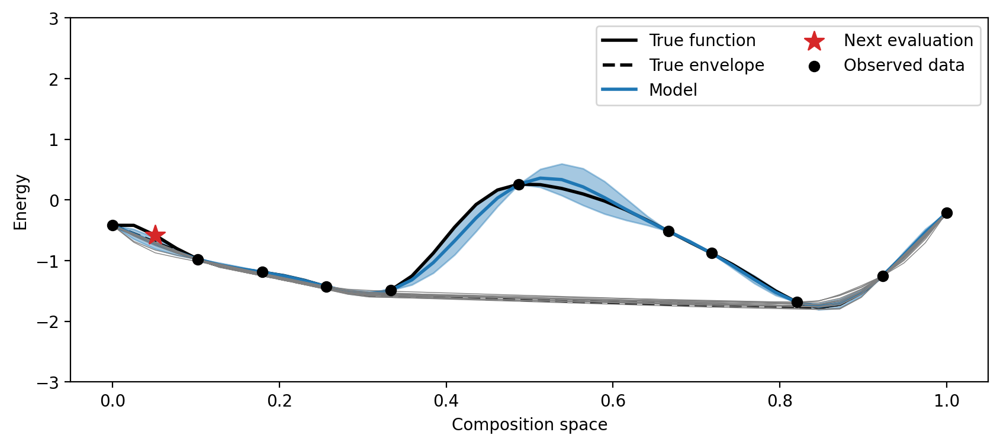

In [81]:
# Set random seed
npr.seed(2)
# Length scale for the kernel
ls = 0.1
true_y, true_envelope = generate_true_function(knot_N)

rng_key = jrnd.PRNGKey(1)

num_iters = 10

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
# include all but endpoints in initial design indicies
design_inds = np.array(range(1, knot_N-1)) 
design_inds = np.array(range(knot_N))
data = (train_x, train_y)


pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N, design_space)

for i in range(num_iters):
    print("Iteration: ", i)
    %time next_x, entropy_change = get_next_candidate(data, design_inds, design_space, rng_key, T=50, J=50)
    print(entropy_change)
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False)
    
    # add observations to data and remove from list of designs to look at 
    data = add_observation(data, true_y, next_x)
    #design_inds = np.delete(design_inds, next_x)
    
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N, design_space) 
    
#distances = compute_distances(data, true_envelope)
#distances.mean()

# Example usage

Here we use T,J=50 MC samples.

In [88]:
# Define some global variables

# Number of points to discretize the space into
knot_N = 40
# grid to discretize design space into
knot_x = np.linspace(0, 1, knot_N)

In [ ]:
make

In [42]:
# Set random seed
npr.seed(2)
# Length scale for the kernel
ls = 0.1
true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

rng_key = jrnd.PRNGKey(1)

num_iters = 9

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 
    
distances = compute_distances(data, true_envelope)
distances.mean()

NameError: name 'kernel' is not defined

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8


DeviceArray(0.51340004, dtype=float64)

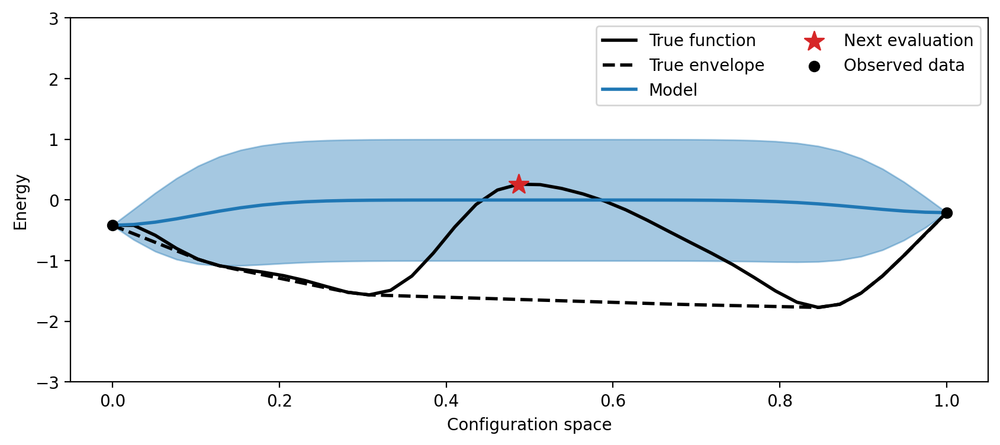

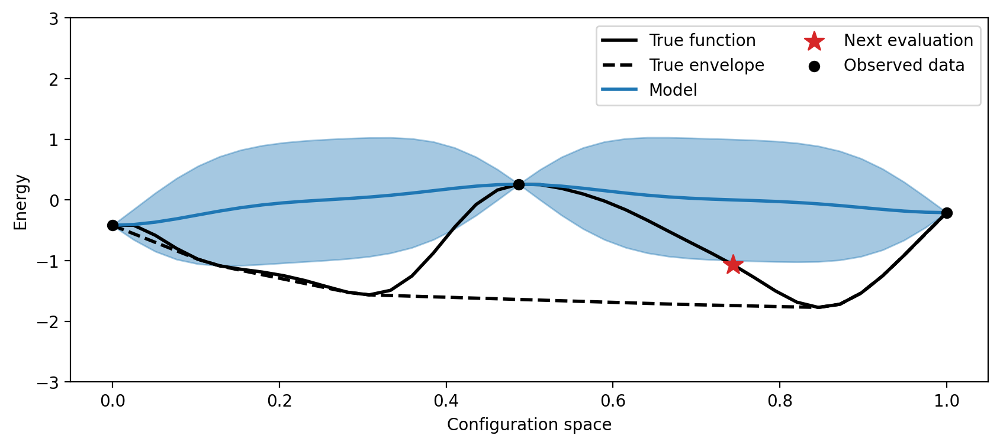

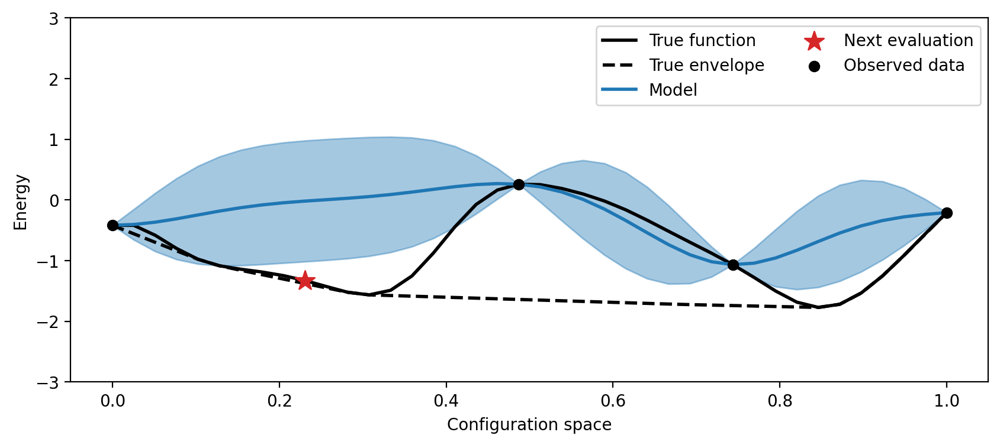

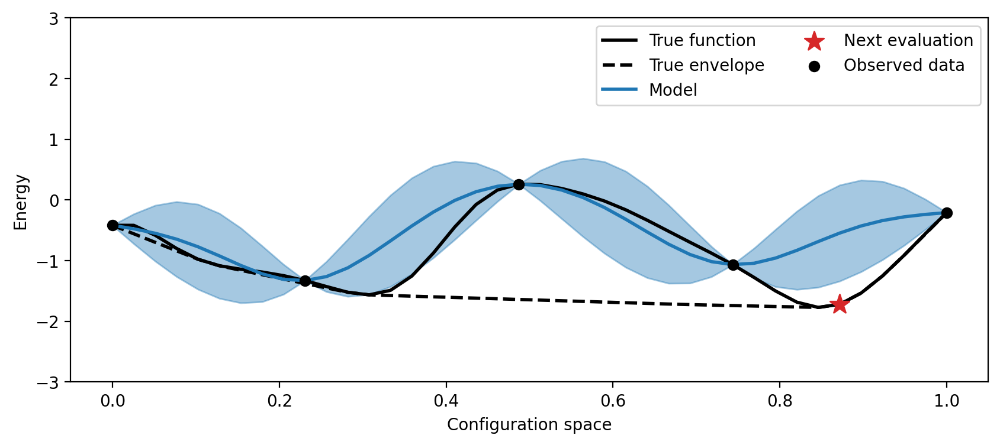

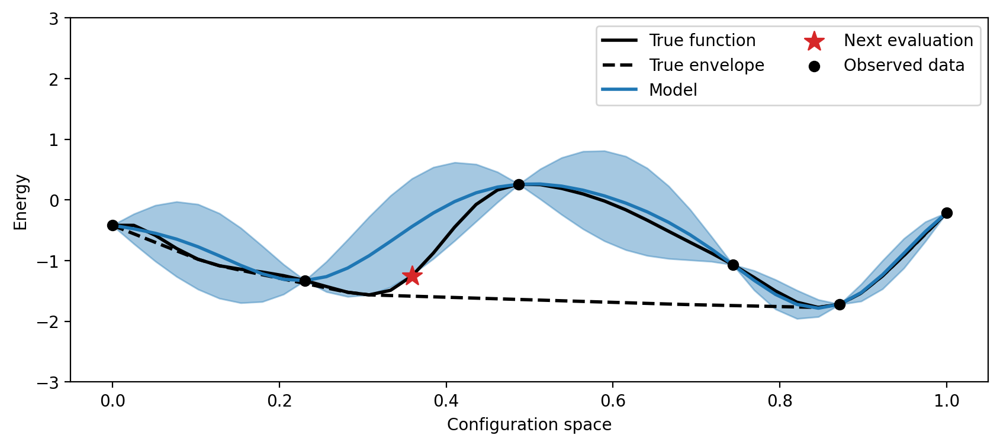

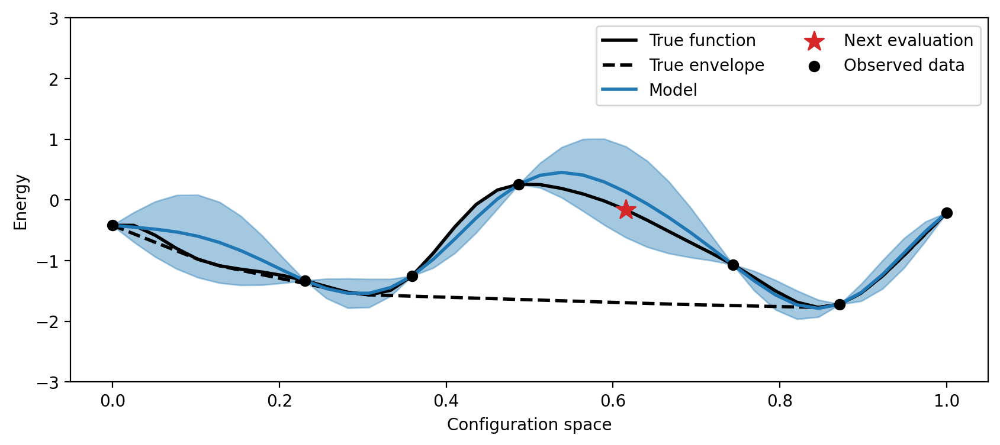

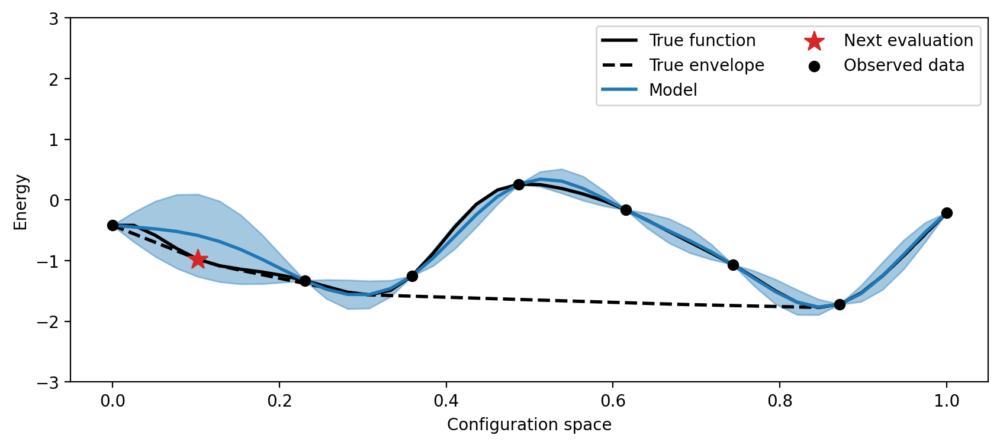

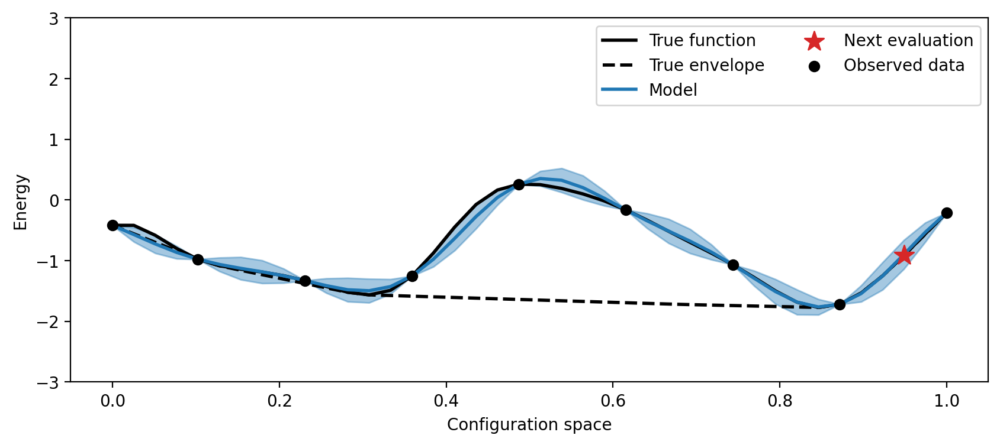

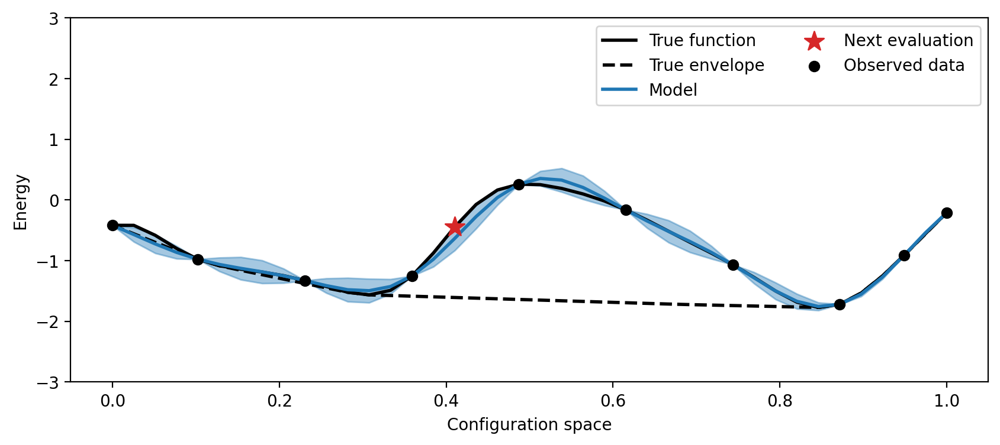

In [81]:
###  baseline

num_iters = 9

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate_baseline(data, knot_x)
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, plot_hulls=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 
    
distances_baseline = compute_distances(data, true_envelope)
distances_baseline.mean()

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8
Iteration:  9
Iteration:  10
Iteration:  11


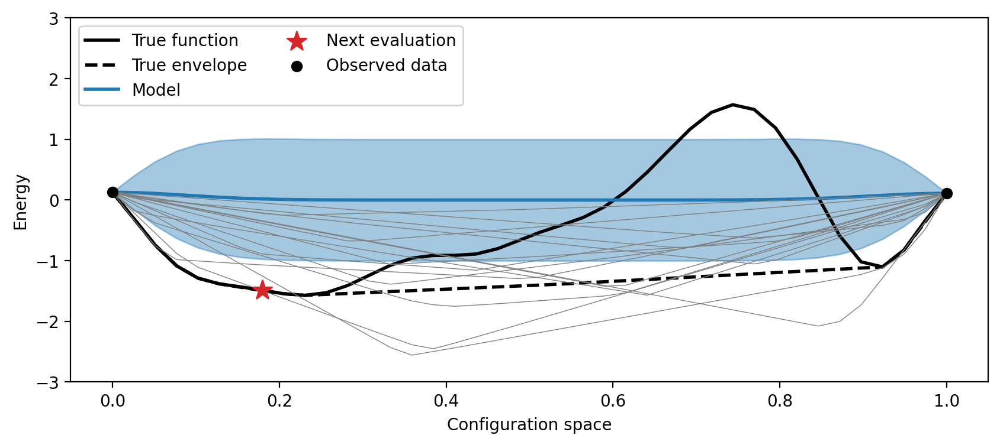

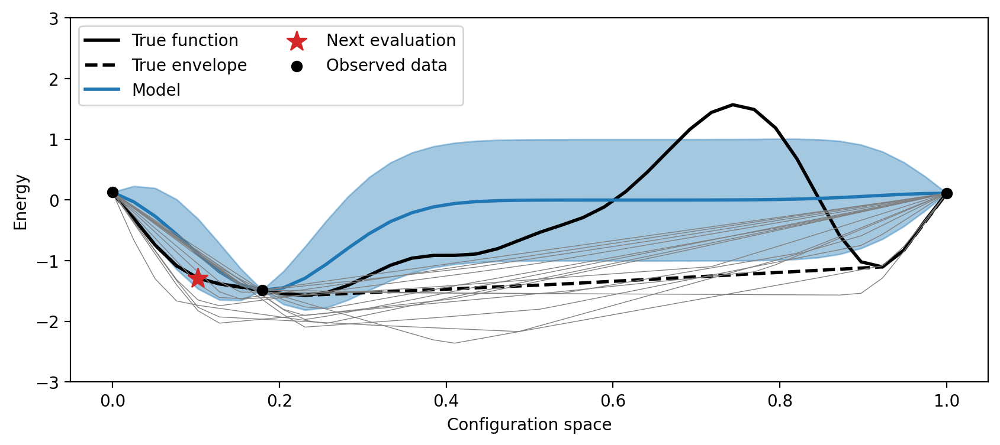

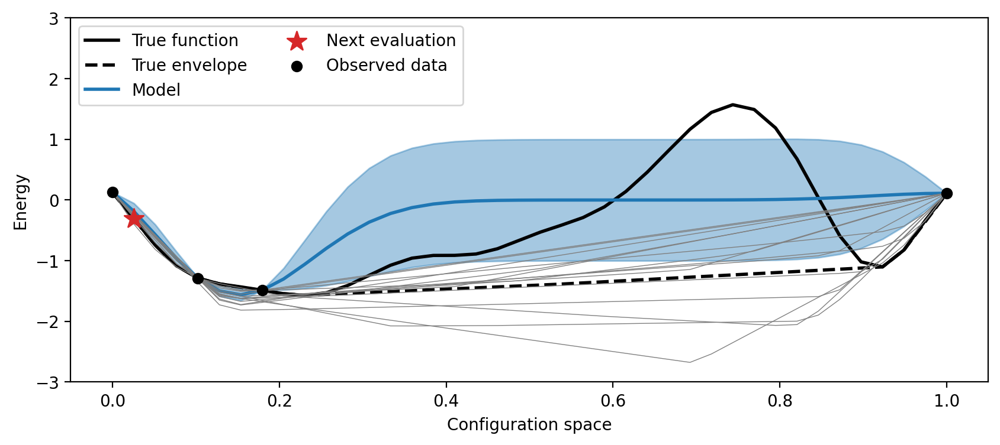

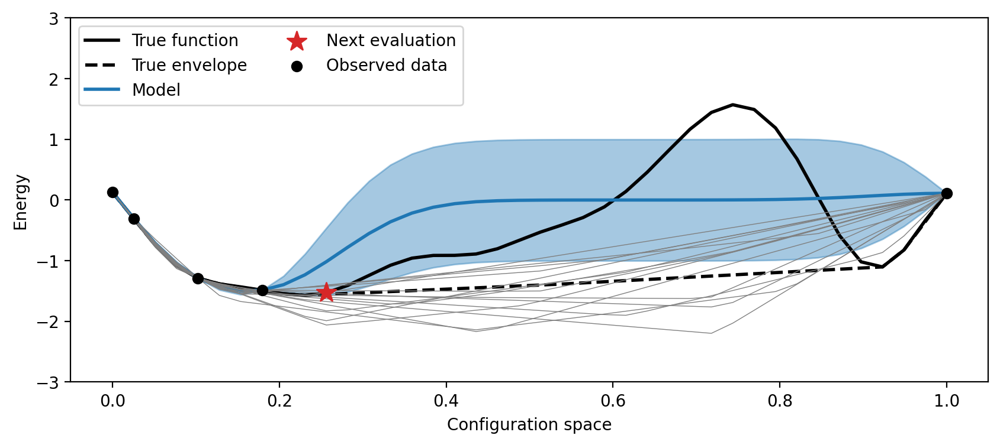

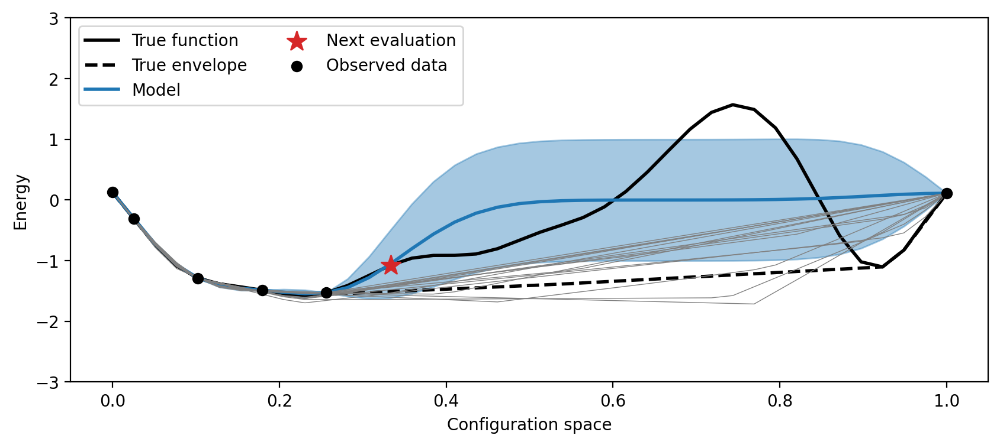

...

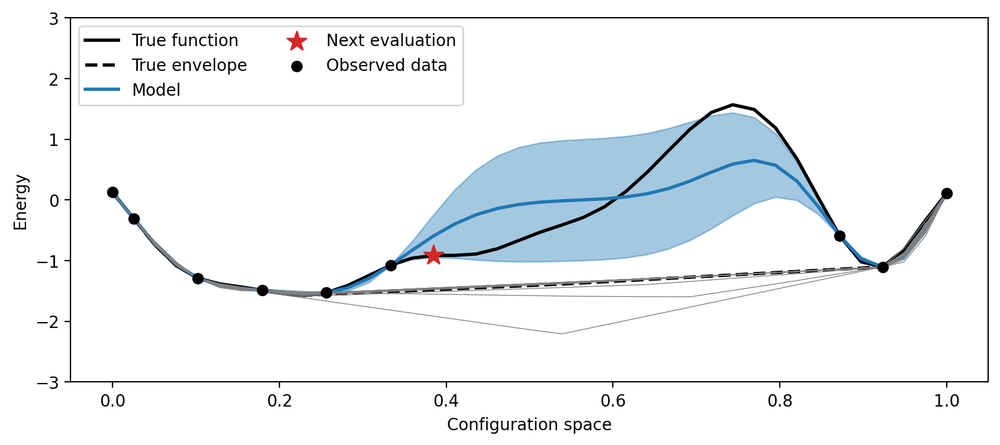

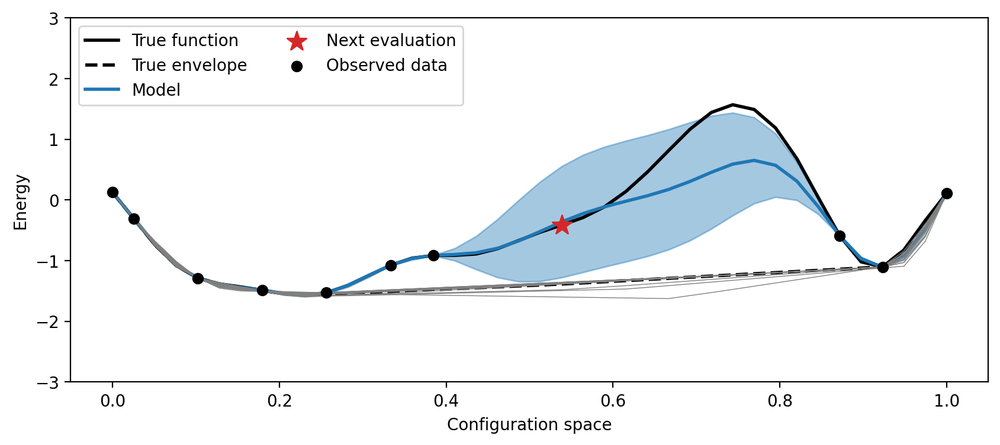

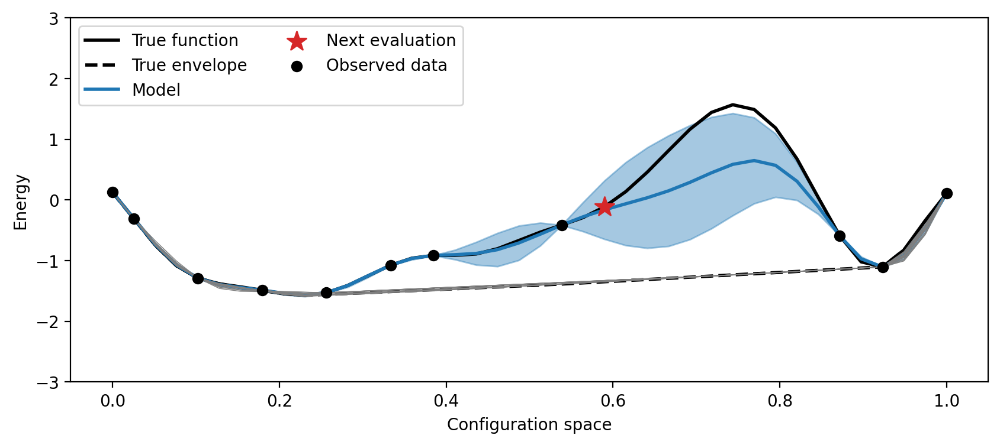

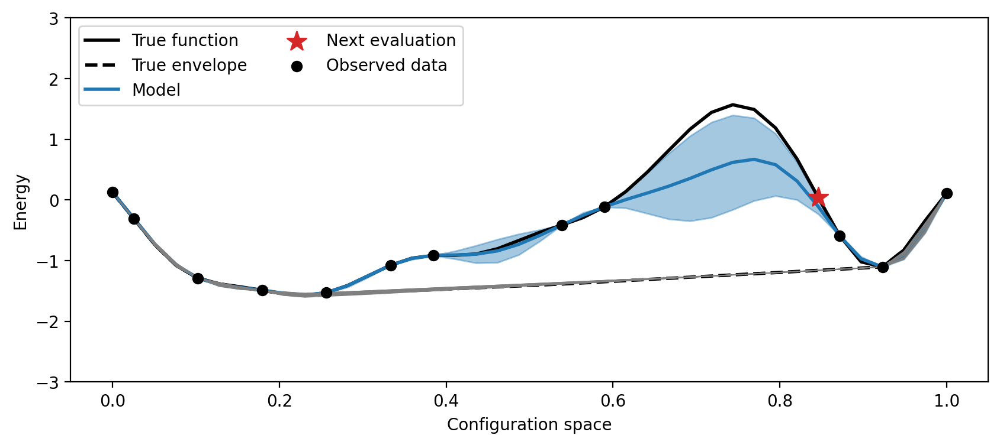

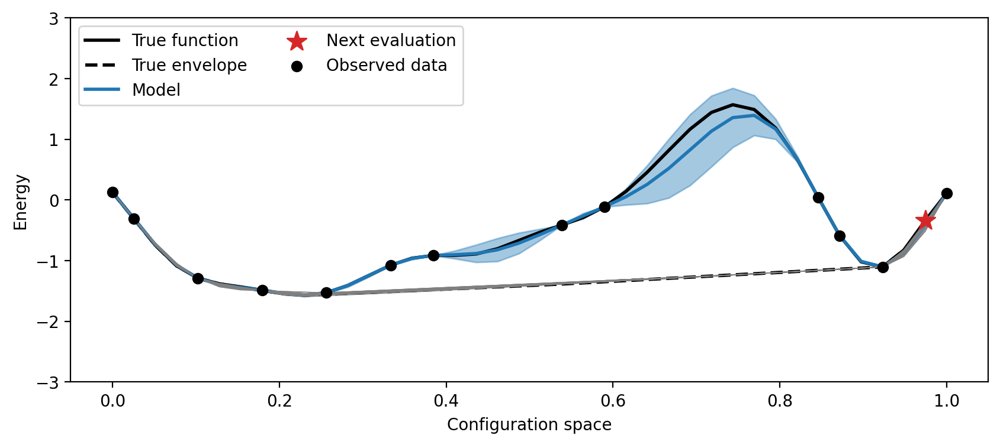

In [8]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 12

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 

# Plots for ID4 slides

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8
Iteration:  9
Iteration:  10
Iteration:  11


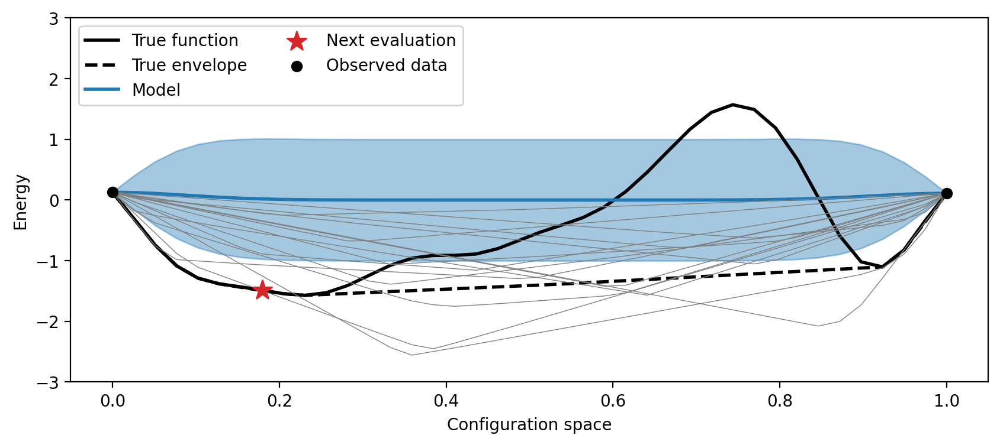

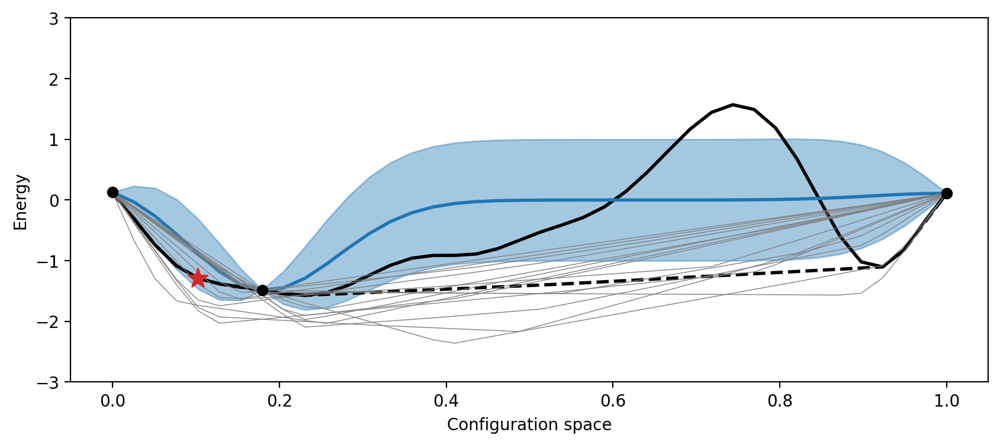

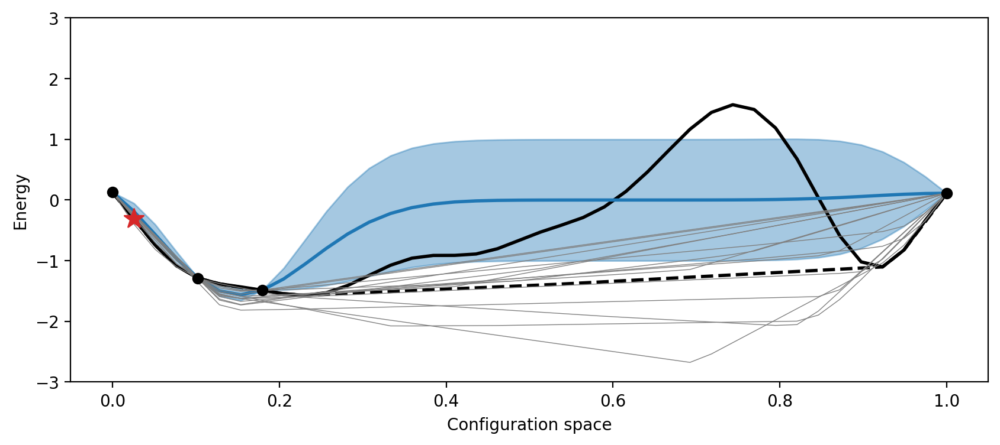

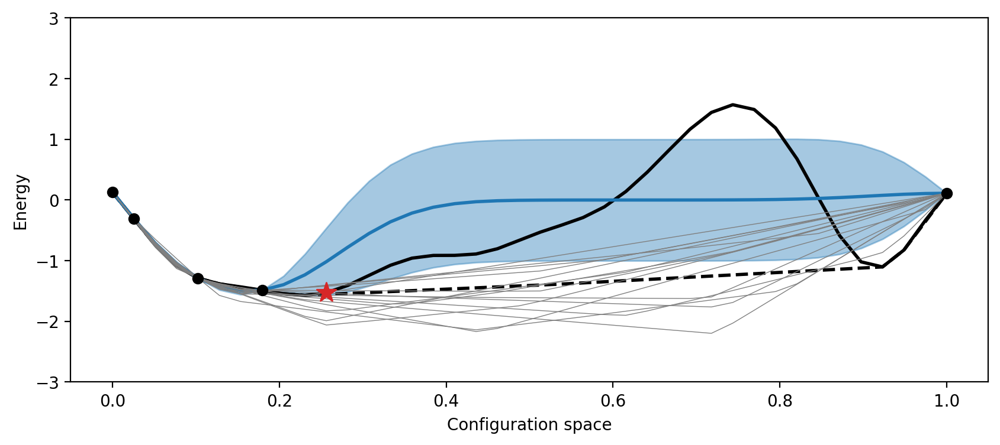

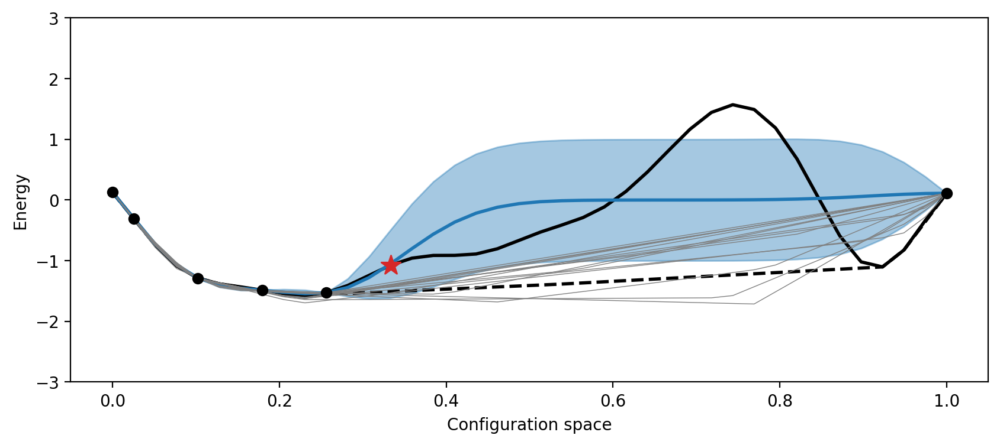

...

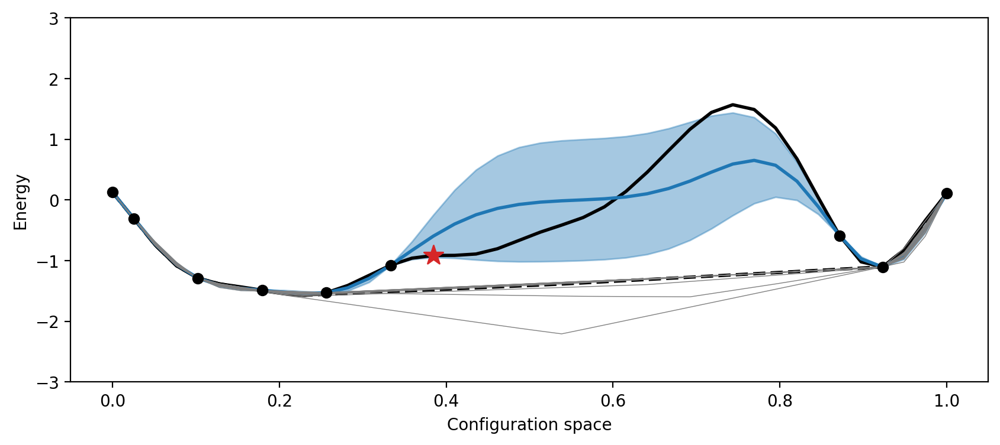

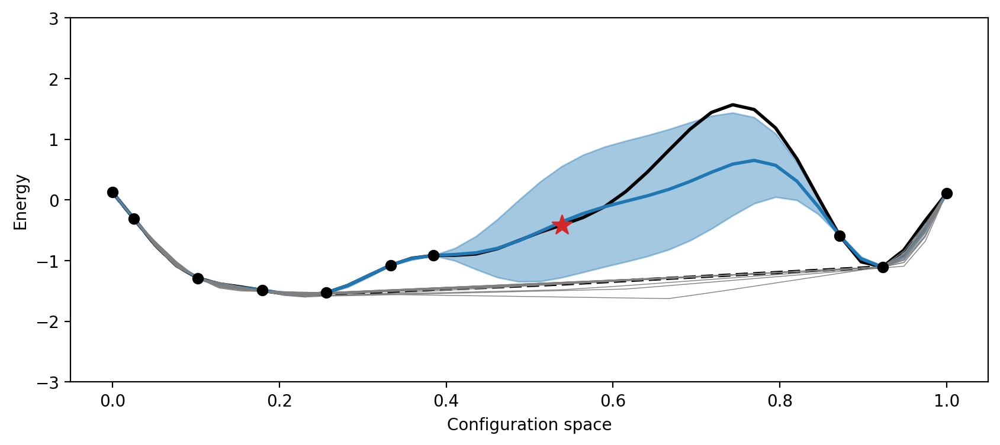

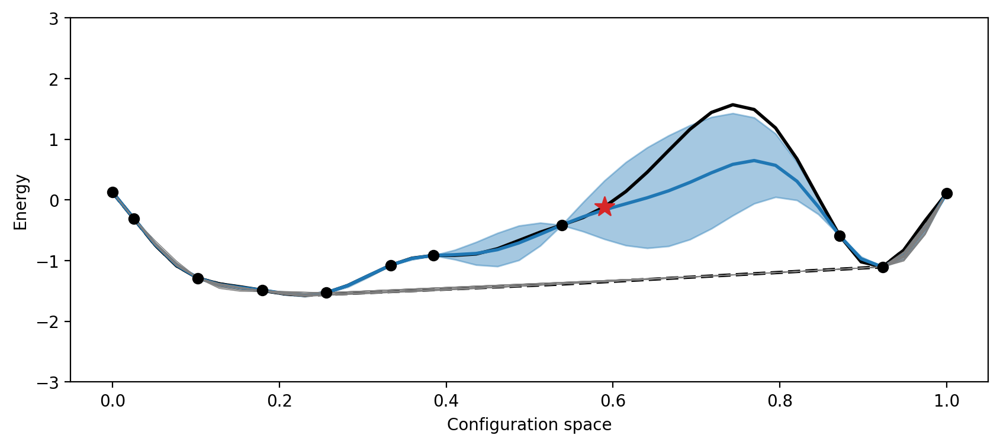

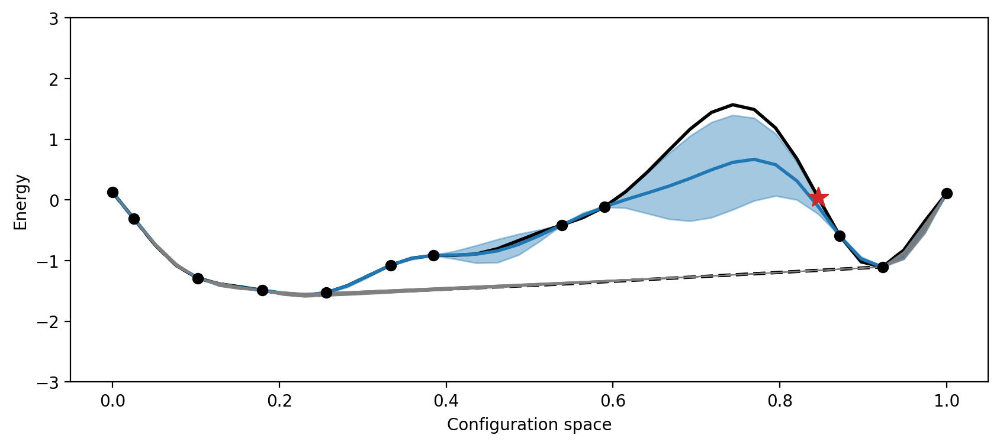

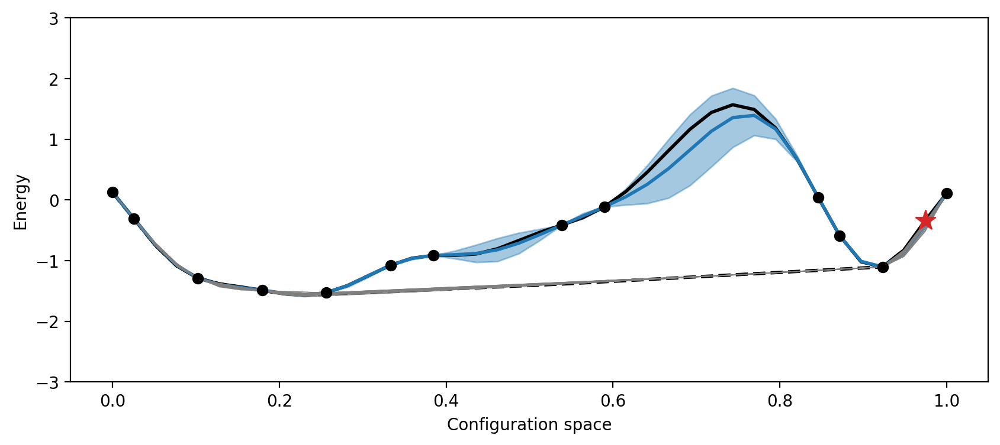

In [17]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 12

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    if i == 0:
        plot_legend = True
    else:
        plot_legend = False
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, legend=plot_legend)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8
Iteration:  9
Iteration:  10
Iteration:  11


DeviceArray(0.66023888, dtype=float64)

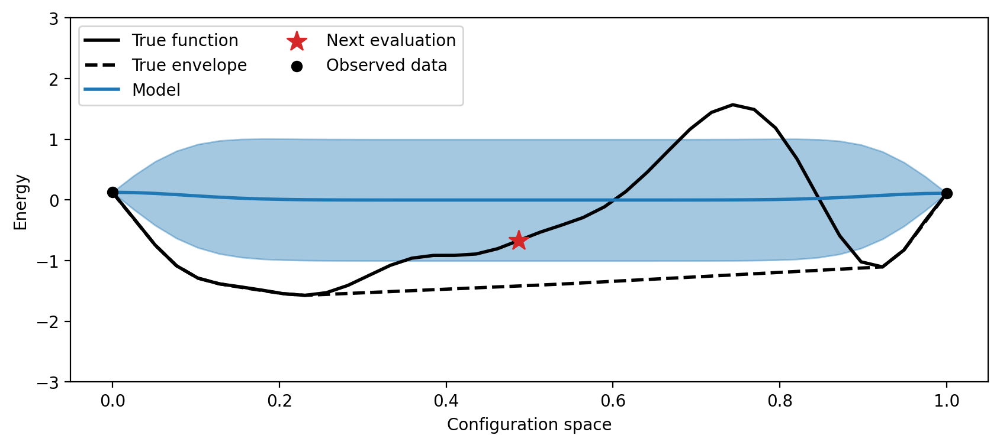

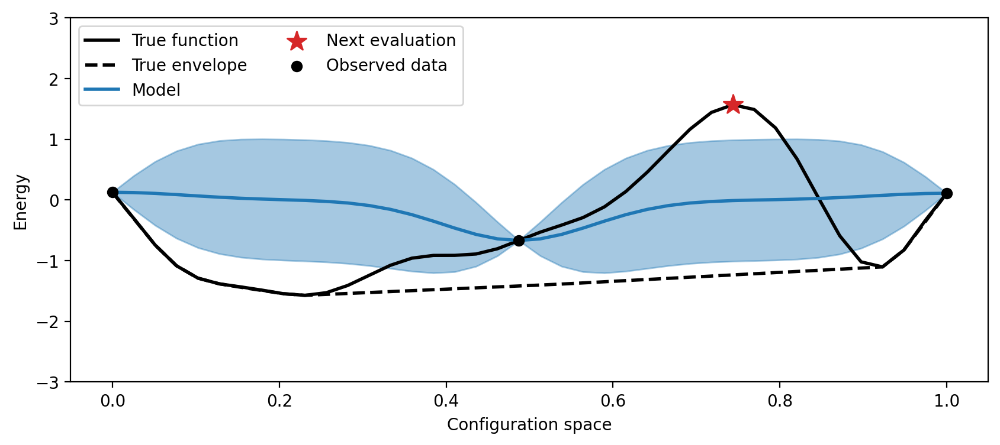

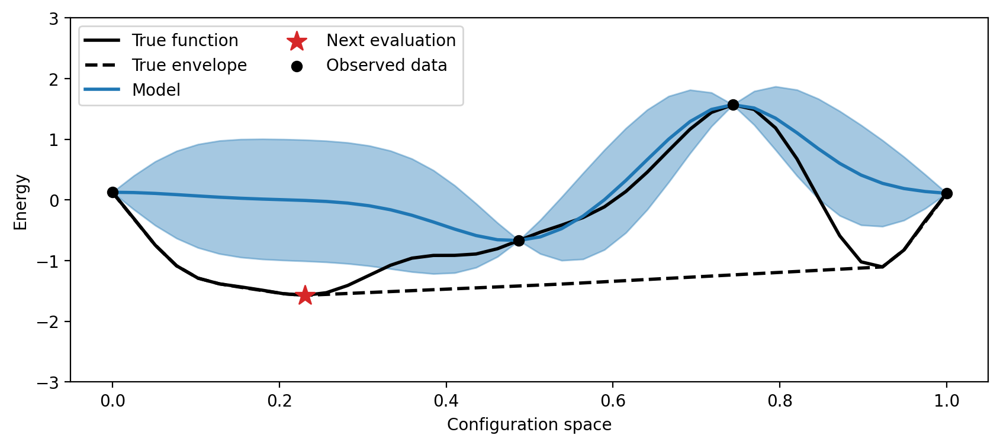

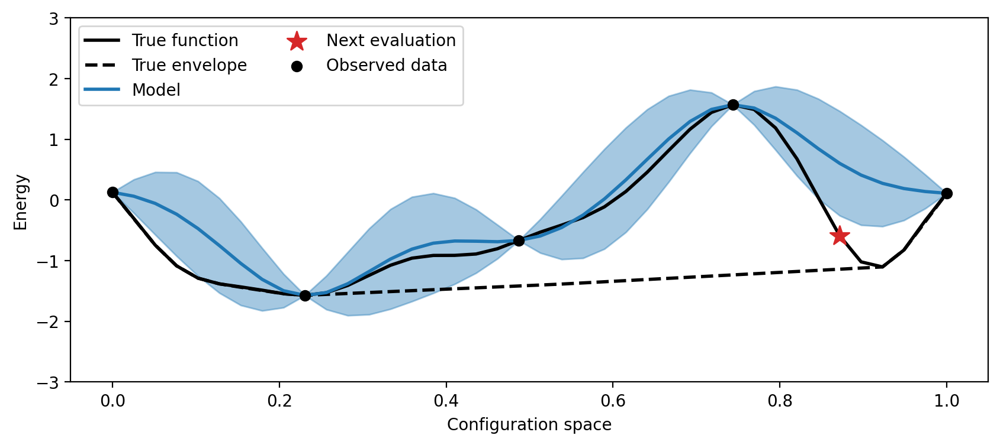

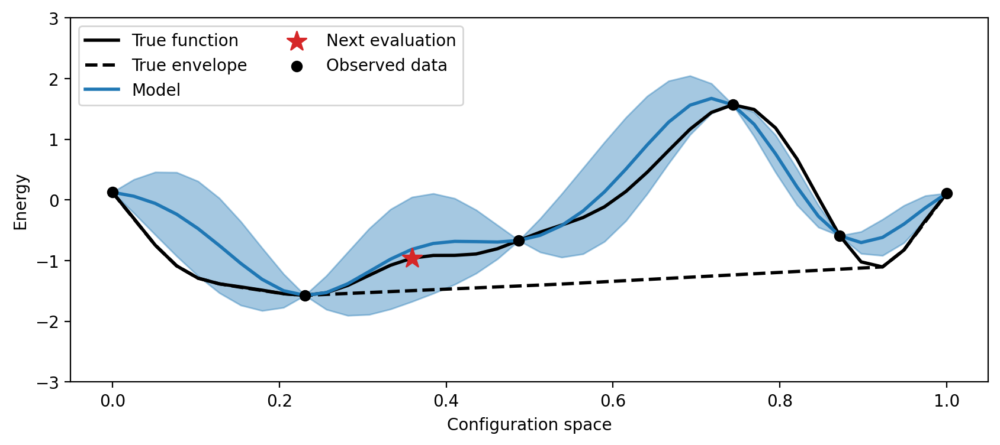

...

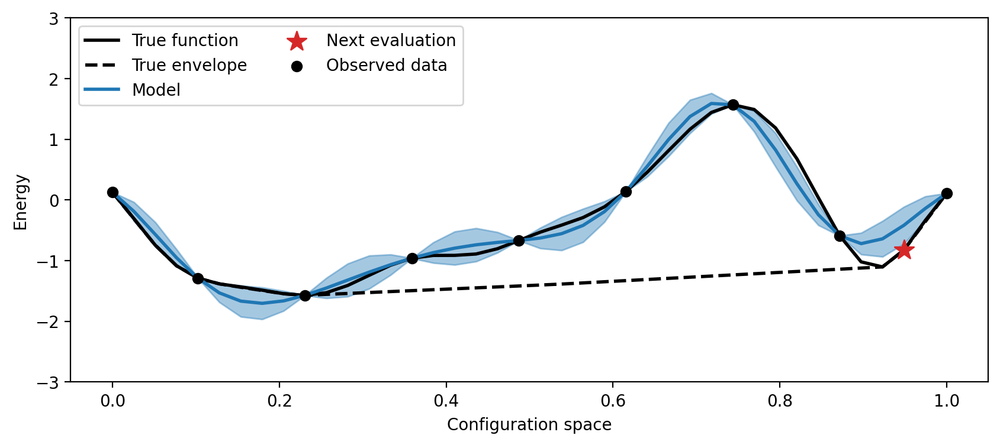

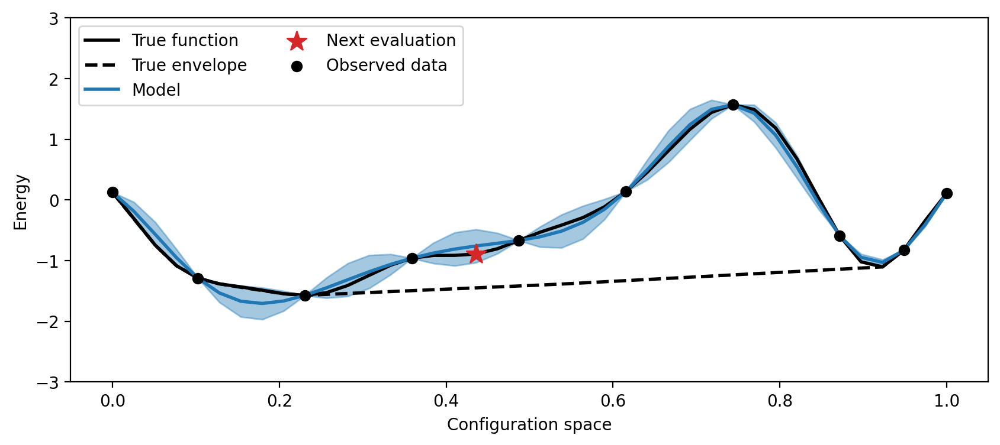

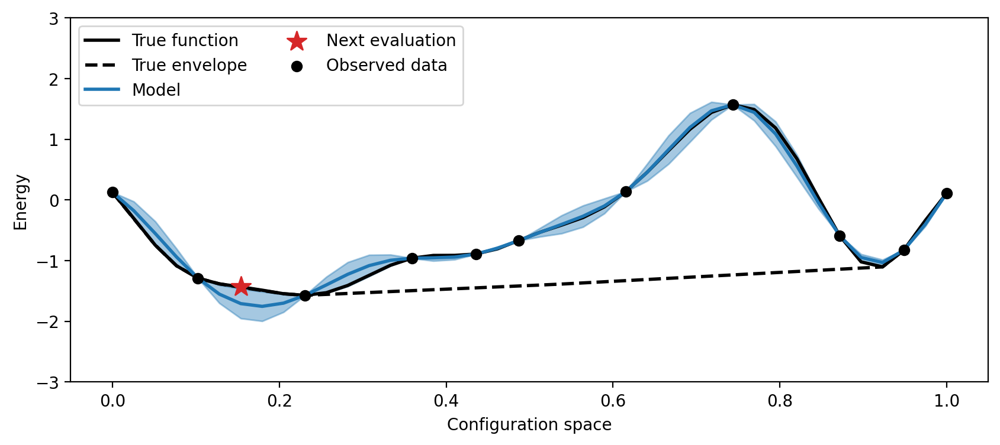

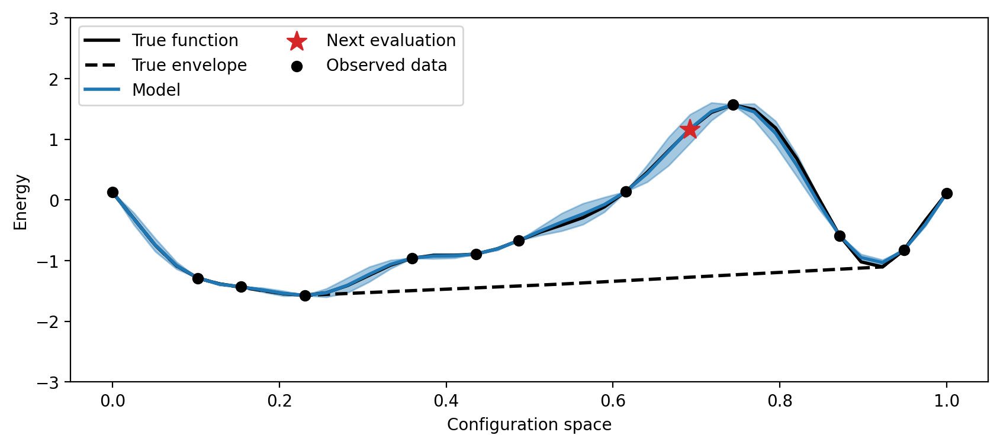

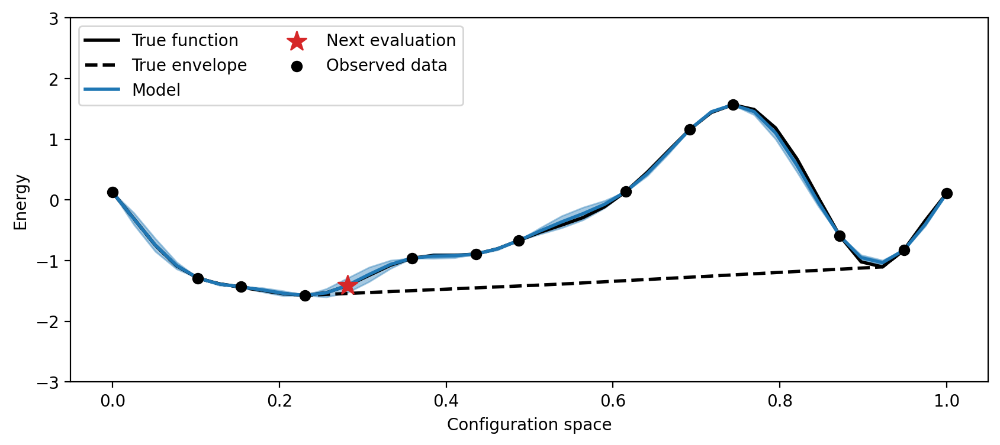

In [82]:
###  baseline

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 12

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate_baseline(data, knot_x)
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, plot_hulls=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 
    
distances_baseline = compute_distances(data, true_envelope)
distances_baseline.mean()

Text(0, 0.5, 'Energy')

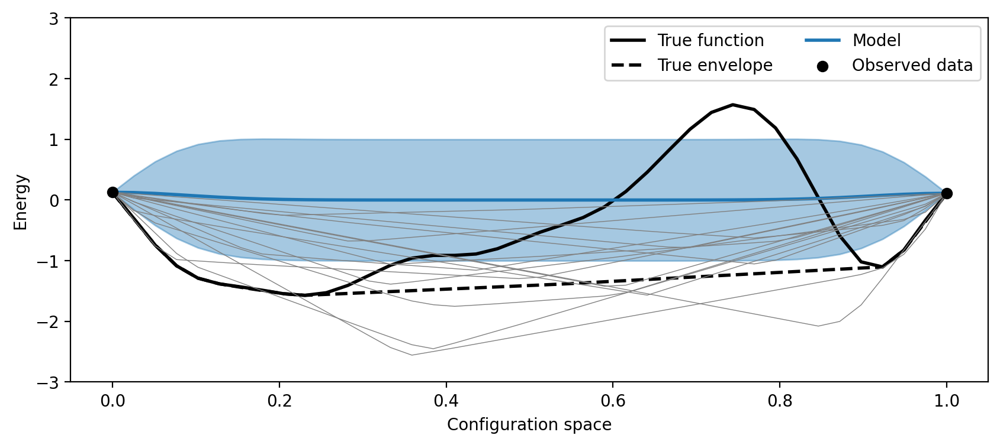

In [16]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)
# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

plt.figure(figsize=(10,4))

# Plot true function, convex hull, and GP model mean + uncertainty
plt.plot(knot_x, true_y, "k", lw=2, label="True function")
plt.plot(knot_x, true_envelope.T, ls="dashed", label="True envelope", lw=2, c="k")
plt.plot(knot_x, pred_mean, lw=2, c="tab:blue", label="Model")
y_err = np.sqrt(np.diag(pred_cov)) 
plt.fill_between(knot_x, pred_mean - y_err, pred_mean + y_err, alpha=0.4, color="tab:blue")
# Plot convex hulls of posterior samples
plt.plot(knot_x, envelopes[:15,:].T, lw=0.5, c="gray")

# Plot data / next evaluation
plt.scatter(train_x, train_y, label="Observed data", c="k", zorder=5)

plt.legend(ncol=2)

plt.ylim(-3,3); plt.xlabel("Configuration space"); plt.ylabel("Energy")

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6


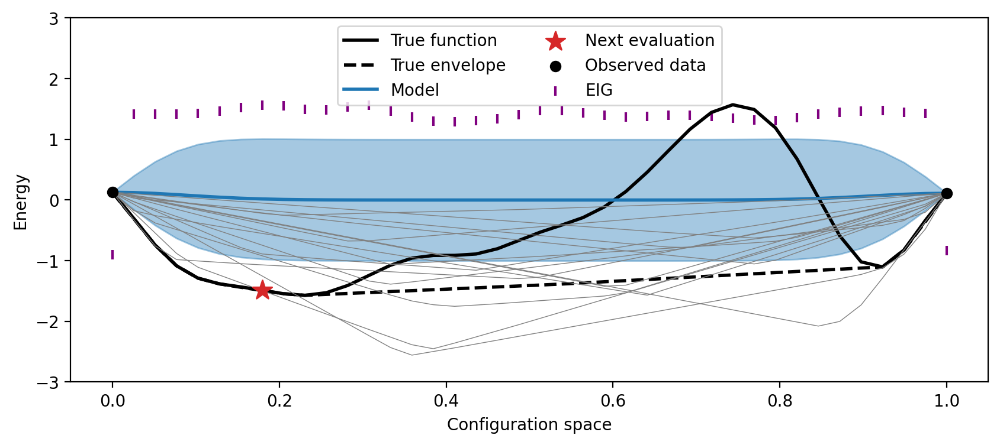

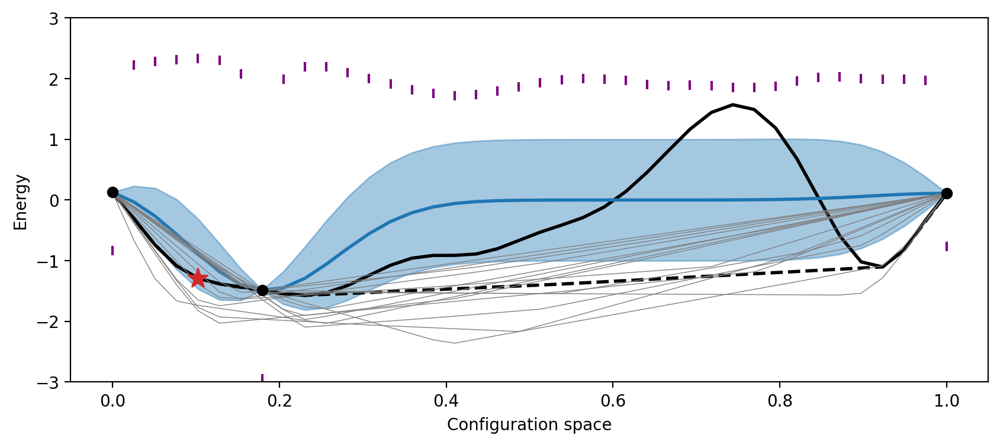

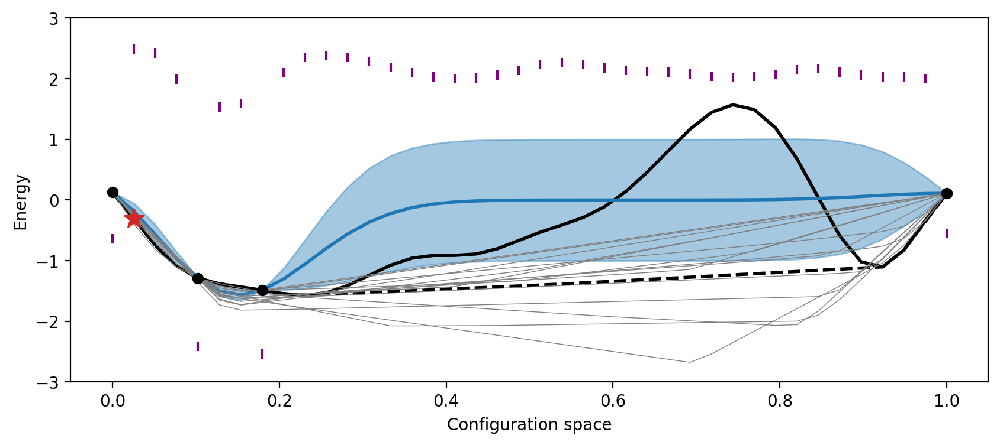

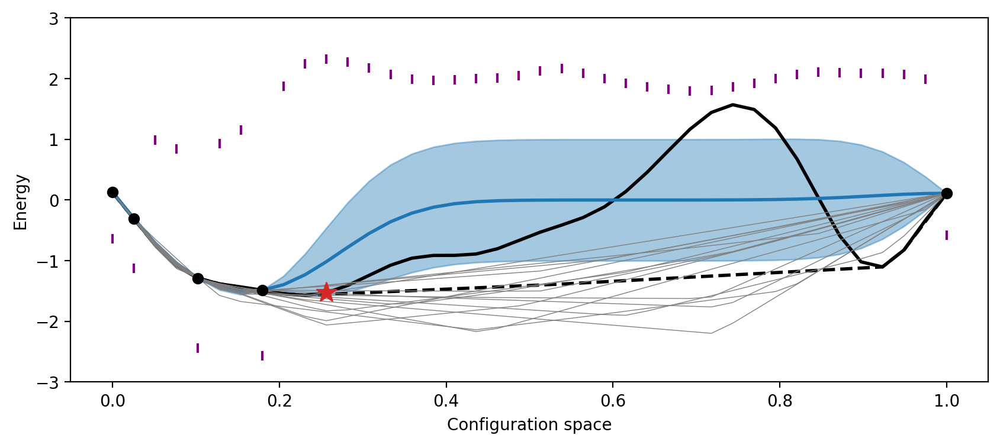

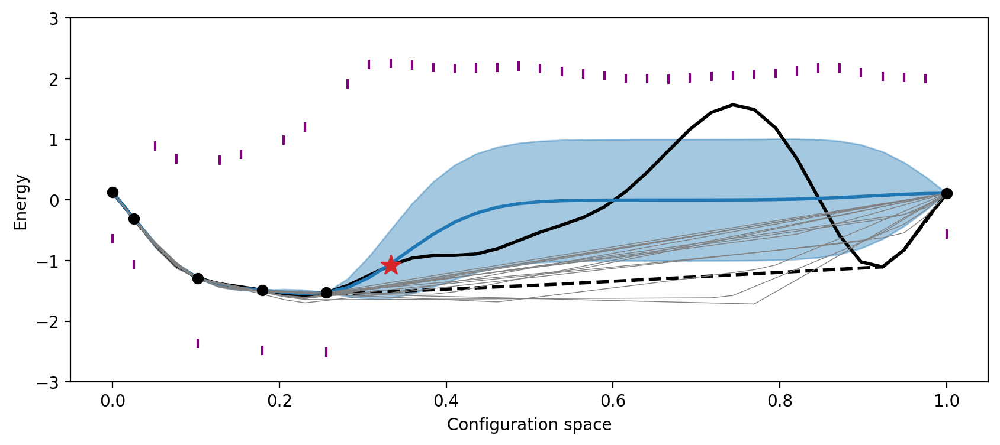

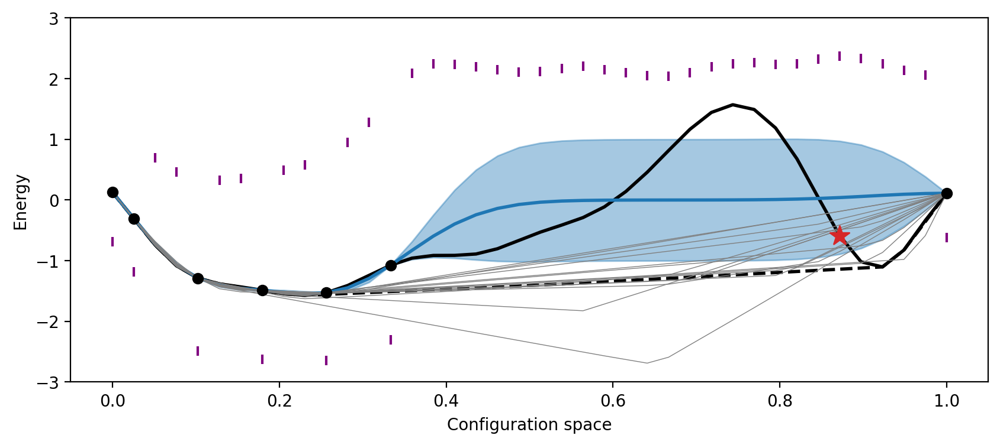

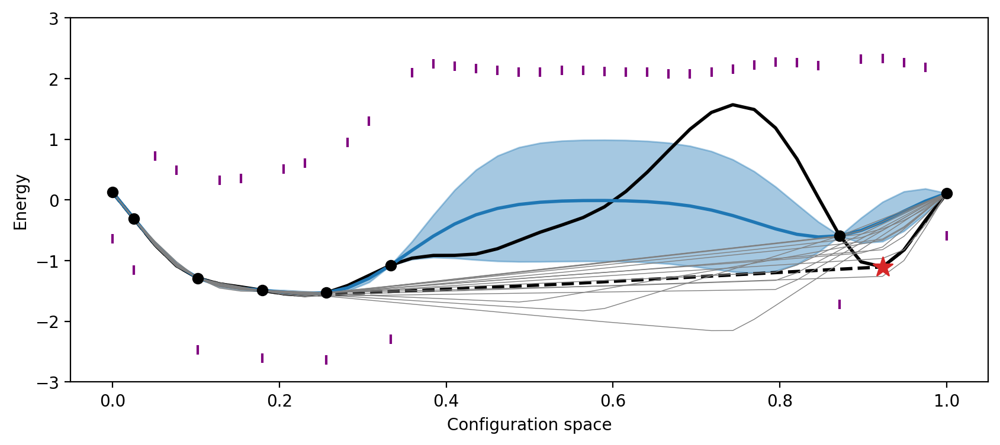

In [20]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 7

# Let's imagine that we start out by observing the two end points.
train_x = np.array([knot_x[0], knot_x[-1]])
train_y = np.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    if i == 0:
        plot_legend = True
    else:
        plot_legend = False
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=True, legend=plot_legend)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 

In [49]:
compute_distances(data, true_envelope).mean()

DeviceArray(0.11370171, dtype=float64)

# higher dimensional example

In [207]:
n_grid = 10

nx, ny = (n_grid, n_grid)
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
xv, yv = np.meshgrid(x, y)
train_x = np.array([xv.flatten(),yv.flatten()]).T

train_x = train_x[train_x.sum(1) <= 1]
pts = []
for x in train_x:
    pts.append((x[0], x[1], 1-x.sum()))
    
knot_N = len(train_x)

In [208]:
 # TODO: make it such that we can pass in a dimension too? or just stick to 1d vs 2d. 
knot_x = np.linspace(0, 1, knot_N)
knot_K = K(kernel_rbf, knot_x, knot_x) + 1e-8 * np.eye(knot_N)
# Cholesky decomposition of the kernel matrix
knot_cK = spla.cholesky(knot_K)
# Form the true function of interest at knot_N number of points
true_y = knot_cK.T @ npr.randn(knot_N)
# compute envelope based on true function
true_envelope = convelope(knot_x, true_y)


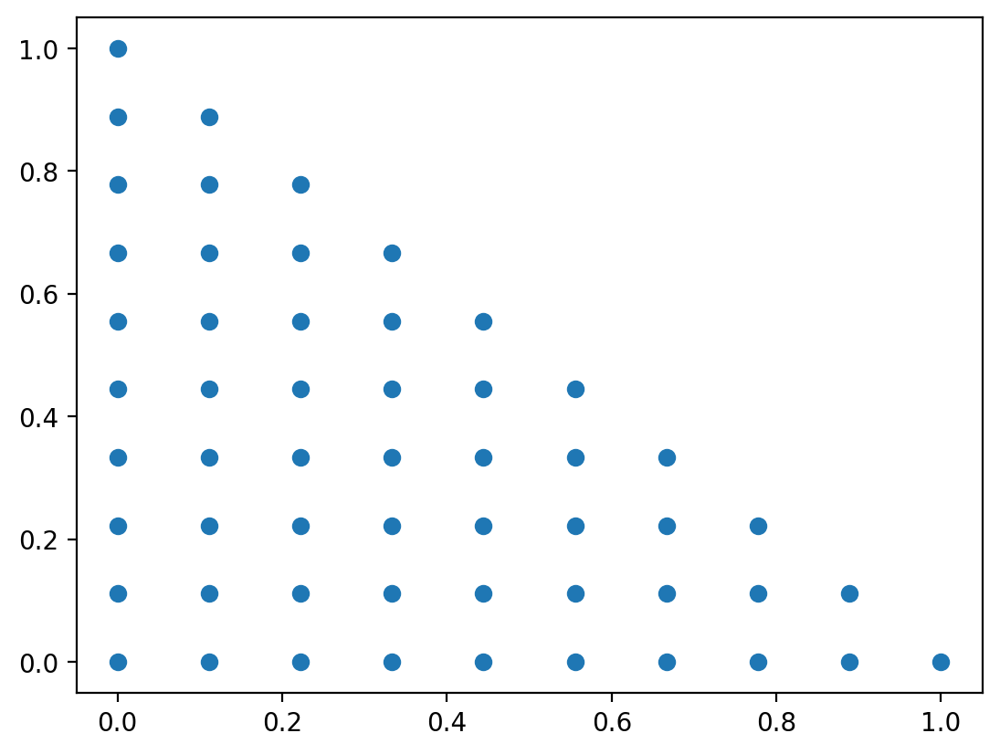

In [214]:
plt.scatter(train_x[:,0], train_x[:,1])

In [226]:
np.exp(true_y)

Array([1.62632071, 1.91677173, 2.24862201, 2.5732482 , 2.8091205 ,
       2.85688837, 2.65314158, 2.22641622, 1.69519772, 1.19358591,
       0.80249504, 0.53476411, 0.36601501, 0.26446934, 0.20490082,
       0.17083708, 0.15251549, 0.14435955, 0.14360407, 0.1490015 ,
       0.16029547, 0.17683854, 0.19650182, 0.21432354, 0.22325067,
       0.21747342, 0.19715716, 0.16914697, 0.14256232, 0.1240692 ,
       0.1171697 , 0.12456318, 0.15110133, 0.20670389, 0.30830884,
       0.47909976, 0.74007651, 1.08921392, 1.48028261, 1.81932517,
       2.0011228 , 1.97172413, 1.76013169, 1.45247402, 1.13724984,
       0.86918562, 0.66657623, 0.52519716, 0.43448674, 0.38557826,
       0.3744623 , 0.40462947, 0.48902426, 0.6548142 , 0.94307276],      dtype=float64)

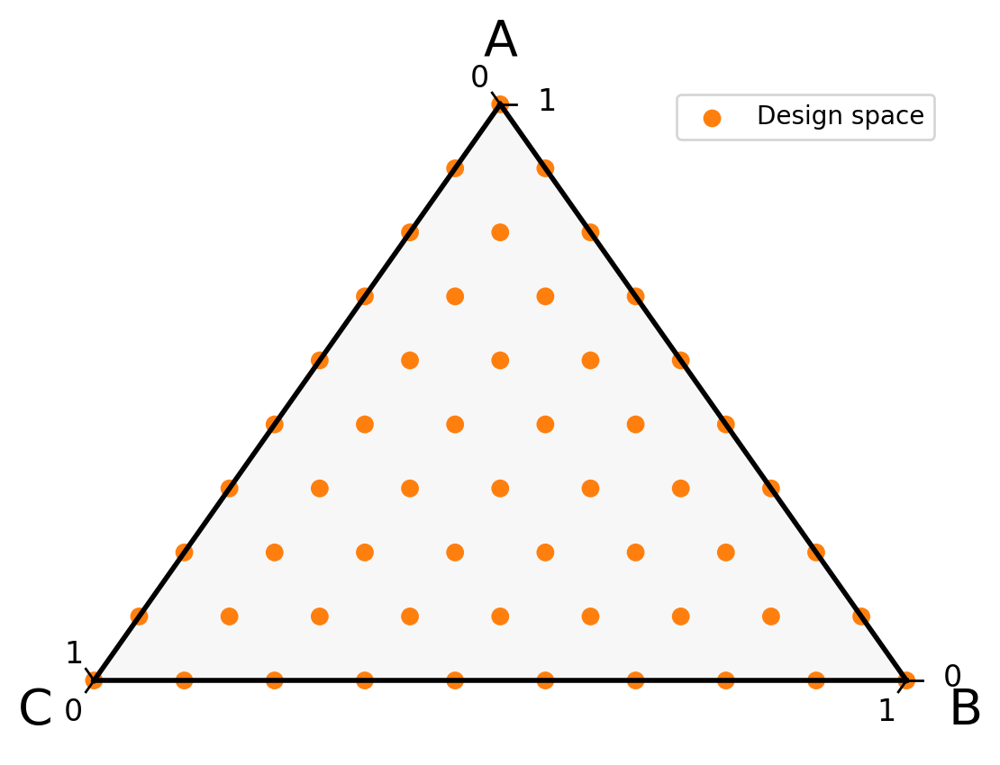

In [229]:
import ternary

fontsize=20
### Scatter Plot
scale = 1
figure, tax = ternary.figure(scale=scale)
#tax.set_title("", fontsize=20)
tax.boundary(linewidth=2.0)
#tax.gridlines(multiple=1, color="blue")

tax.scatter(pts, marker=".", label="Design space", s=np.exp(true_y), sizes=np.ones(len(pts))*150, cmap="plasma")
tax.legend(loc="upper right")



tax.right_corner_label("B", fontsize=fontsize)
tax.top_corner_label("A", fontsize=fontsize)
tax.left_corner_label("C", fontsize=fontsize)
tax.get_axes().axis('off')
tax.clear_matplotlib_ticks()
tax.ticks(axis='lbr', linewidth=1, multiple=1, offset=0.02, fontsize=12)
tax.show()

In [131]:
deriv_marg_var = 100
    s = np.linspace(-3*np.sqrt(deriv_marg_var), 3*np.sqrt(deriv_marg_var), 500)

    knot_y = np.atleast_2d(knot_y) # samples x num_primal
    sx = s[:,np.newaxis] * knot_x[np.newaxis,:] # num_dual x num_primal
    # compute the conjugate
    lft1 = np.max(sx[np.newaxis,:,:] - knot_y[:,np.newaxis,:],  axis=2) # samples x num_dual
    # compute the biconjugate
    lft2 = np.max(sx[np.newaxis,:,:] - lft1[:,:,np.newaxis],  axis=1) # samples x num_primal
    return lft2

In [133]:
pts

[(Array(0., dtype=float64),
  Array(0., dtype=float64),
  Array(1., dtype=float64)),
 (Array(0.5, dtype=float64),
  Array(0., dtype=float64),
  Array(0.5, dtype=float64)),
 (Array(1., dtype=float64),
  Array(0., dtype=float64),
  Array(0., dtype=float64)),
 (Array(0., dtype=float64),
  Array(0.5, dtype=float64),
  Array(0.5, dtype=float64)),
 (Array(0.5, dtype=float64),
  Array(0.5, dtype=float64),
  Array(0., dtype=float64)),
 (Array(0., dtype=float64),
  Array(1., dtype=float64),
  Array(0., dtype=float64))]

In [124]:
pts

[(Array(0., dtype=float64),
  Array(0., dtype=float64),
  Array(1., dtype=float64)),
 (Array(0.5, dtype=float64),
  Array(0., dtype=float64),
  Array(0.5, dtype=float64)),
 (Array(1., dtype=float64),
  Array(0., dtype=float64),
  Array(0., dtype=float64)),
 (Array(0., dtype=float64),
  Array(0.5, dtype=float64),
  Array(0.5, dtype=float64)),
 (Array(0.5, dtype=float64),
  Array(0.5, dtype=float64),
  Array(0., dtype=float64)),
 (Array(1., dtype=float64),
  Array(0.5, dtype=float64),
  Array(-0.5, dtype=float64)),
 (Array(0., dtype=float64),
  Array(1., dtype=float64),
  Array(0., dtype=float64)),
 (Array(0.5, dtype=float64),
  Array(1., dtype=float64),
  Array(-0.5, dtype=float64)),
 (Array(1., dtype=float64),
  Array(1., dtype=float64),
  Array(-1., dtype=float64))]